# TVB-NEST: Bridging multiscale activity by co-simulation

## Step-by-step learn how to perform a co-simulation embedding spiking neural networks into large-scale brain networks using TVB.

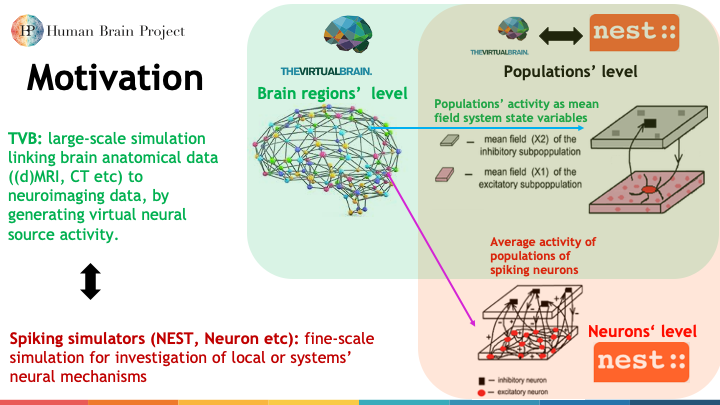

In [1]:
from IPython.core.display import Image, display
display(Image(filename='./ConceptGraph1.png',  width=1000, unconfined=False))

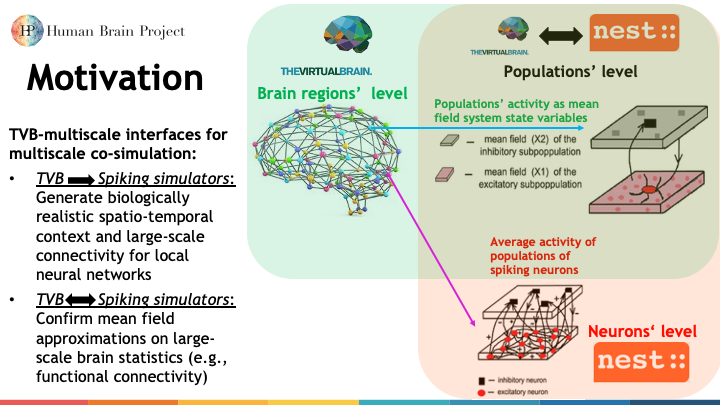

In [2]:
display(Image(filename='./ConceptGraph2.png',  width=1000, unconfined=False))

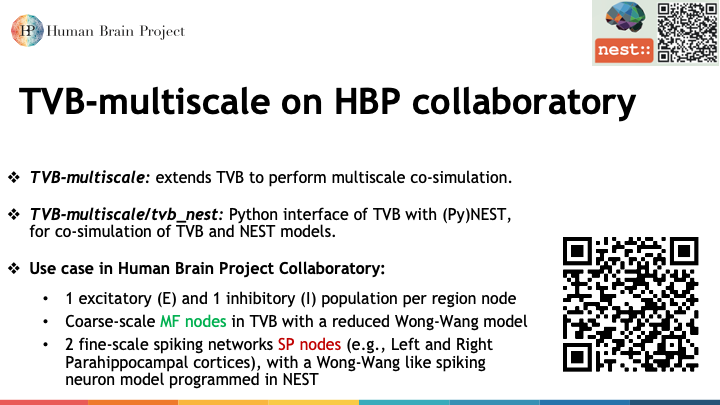

In [3]:
display(Image(filename='./Overview.png',  width=1000, unconfined=False))

## tvb-multiscale toolbox:

### https://github.com/the-virtual-brain/tvb-multiscale

For questions use the git issue tracker, or write an e-mail to me: dionysios.perdikis@charite.de

### TVB - NEST co-simulation with Reduced Wong-Wang model

We demonstrate a multiscale simulation <br> of a reduced Wong-Wang model [3] <br> using TVB [1, 2] for brain region modelled at coarse scale, <br> and NEST [4] for regions modelled as <br> networks of spiking neural populations.

## Reduced Wong-Wang mean field model

For every region node $n\prime$ modelled as a mean-field node in TVB:

(Post)Synaptic gating dynamics (i.e., proportion of synapse channels open at any given time):

$\dot{S_{n\prime}}^{(E)} = - \frac{1}{\tau_E}{S_{n\prime}}^{(E)}(t) + (1-{S_{n\prime}}^{(E)}(t))\gamma_{E} {r_{n\prime}}^{(E)}(t)$

$\dot{S_{n\prime}}^{(I)} = - \frac{1}{\tau_I}{S_{n\prime}}^{(I)}(t) + \gamma_I{r_{n\prime}}^{(I)}(t)$

where we bound ${S_{n\prime}}^{(E/I)}(t) \in $ [0.0, 1.0], 

and $ {r_{n\prime}}^{(E/I)}(t) $ is the postsynaptic firing rate given by:

$ {r_{n\prime}}^{(E/I)}(t) = H({I_{syn_{n\prime}}}^{(E/I)}(t), a_{(E/I)}, b_{(E/I)}, d_{(E/I)}) $

where

$ H({I_{syn_{n\prime}}}^{(E/I)}(t),  a_{(E/I)}, b_{(E/I)}, d_{(E/I)}) = \frac{a_{(E/I)}{I_{syn_{n\prime}}}^{(E/I)}(t)-b_{(E/I)}}{1-e^{-d_{(E/I)}(a_{(E/I)}{I_{syn_{n\prime}}}^{(E/I)}(t)-b_{(E/I)})}}$ 

is a sigmoidal activation function of the input presynaptic current.

The total input presynaptic current to excitatory populations is given by: 

$ {I_{syn_{n\prime}}}^{(E)}(t) = W_EI_o + w_+J_{NMDA}{S_{n\prime}}^{(E)}(t) - J_{{n\prime}}{S_{n\prime}}^{(I)}(t) + GJ_{NMDA}\sum_{{m\prime}\neq {n\prime}}C_{{m\prime}{n\prime}}S_{m\prime}^{(E)}(t-\tau_{{m\prime}{n\prime}})$

and to inhibitory ones:

$ {I_{syn_{n\prime}}}^{(I)}(t) = W_II_o + J_{NMDA}{S_{n\prime}}^{(E)}(t) - {S_{n\prime}}^{(I)}(t) +  \lambda GJ_{NMDA}\sum_{{m\prime}\neq {n\prime}}C_{{m\prime}{n\prime}}S_{m\prime}^{(E)}(t-\tau_{{m\prime}{n\prime}})$

where 
$\lambda  \in$[0, 1] for scaling feedforward inhibition.

TVB connectivity weights $C_{{m\prime}{n\prime}}$ are scaled per "region"

## Reduced Wong-Wang mean field model

## Parameters following Ponce-Alvarez et al 2014:

- structural TVB connectivity weights $C_{{m\prime}{n\prime}}$ (${m\prime}->{n\prime}$)
- structural TVB connectivity delays $\tau_{{m\prime}{n\prime}}$  (${m\prime}->{n\prime}$)
- global structural brain connectivity coupling constant $G$
- overall effective external input current $I_o = 0.382nA$ 
- excitatory synaptic coupling $J_{NDMA} = 0.15nA$ 
- local feedback inhibitory synaptic coupling $J_{i} = 1.0nA$ 
- local excitatory recurrence $w_+ = 1.4$
- excitatory kinetic parameter $\gamma_E = 0.641 s$
- inhibitory kinetic parameter $\gamma_I = 1.0 s$
- excitatory (NMDA) time constant $\tau_E = \tau_{NMDA}=100ms$ 
- inhibitory (GABA) time constant $\tau_I = \tau_{GABA}=10ms$ 
- excitatory pool scaling constant $W_E = 1.0$
- inhibitory pool scaling constant $W_I = 0.7$
- excitatory sigmoidal functions parameters $a_{E} = 310nC^{-1}$, $b_{E} = 125Hz$, $d_{E} = 0.16s$
- inhibitory sigmoidal functions parameters $a_{I} = 615nC^{-1}$, $b_{I} = 177Hz$, $d_{I} = 0.087s$
- $\lambda = 1$, allowing for feedforward inhibition


## Spiking network model in NEST

For every neuron $i$ in region node $n$ modelled in NEST as a spiking network:


$ C_m{\dot{V}_{ni}}^m = - {I_{ni}}^L(t) - {I_{ni}}^{AMPA}(t) - {I_{ni}}^{NMDA}(t) - {I_{ni} ^{GABA}}(t)- {I_{ni}}^{AMPA,ext}(t)-G\sum_{n\prime n}C_{n\prime \neq n}{I_{n\prime n,i}}^{dc}(t-\tau_{n\prime n}) +{I_{ni}}^{ext}(t) $

$\;\;\;\;\;\;\;\;\;\;=-g_m({V_{ni}}^m(t) - V_L) $
              
$\;\;\;\;\;\;\;\;\;\;\;-g_{AMPA}({V_{ni}}^m(t) - V_E)w_E{S_{ni}}^{AMPA}(t) $

$\;\;\;\;\;\;\;\;\;\;\;-\frac{g_{NMDA}({V_{ni}}^m(t) - V_E)}{1+\lambda_{NMDA}e^{-\beta{V_{ni}}^m(t)}}w_E{S_{ni}}^{NMDA}(t) $

$\;\;\;\;\;\;\;\;\;\;\;-g_{GABA}({V_{ni}}^m(t) - V_I)w_I{S_{ni}}^{GABA}(t) $

$\;\;\;\;\;\;\;\;\;\;\;-g_{AMPA,ext}({V_{ni}}^m(t) - V_E)G\sum_{n\prime \neq n}C_{n\prime \neq n}{S_{n\prime \neq ni}}^{AMPA,ext}(t) $

$\;\;\;\;\;\;\;\;\;\;\;+{I_{ni}}^{ext}(t) $

$ {\dot{S}_{ni}}^{AMPA/GABA} = -\frac{1}{\tau_{AMPA/GABA,decay}}{S_{ni}}^{AMPA/GABA}(t) + \left[ \sum_{j=1,j \neq i}^{N_{E/I}} \sum_k \delta(t-{t_j}^k) \right]_{j \in n}$

$ {\dot{X}_{ni}}^{NMDA} = -\frac{1}{\tau_{NMDA,rise}}{X_{ni}}^{NMDA}(t) + \left[ \sum_{j=1,j \neq i}^{N_E} \sum_k \delta(t-{t_j}^k) \right]_{j \in n} $

$ {\dot{S}_{ni}}^{NMDA} = -\frac{1}{\tau_{NMDA,decay}}{S_{ni}}^{NMDA}(t) + \alpha {X_{ni}}^{NMDA}(t) (1 - \frac{1}{N_E-1}{S_{ni}}^{NMDA}(t)) $

$ {\dot{S}_{n\prime \neq ni}}^{AMPA,ext} = -\frac{1}{\tau_{AMPA,decay}}{S_{n\prime \neq ni}}^{AMPA,ext}(t) + \left[ \sum_{j=1}^{N_E} \sum_k \delta(t-\tau_{n\prime n}-{t_j}^k) \right]_{j \in n\prime, n\prime \neq n} $

Boundaries assuming that self-connections of neurons are not possible:

For excitatory neurons:

$ {S_{n,exc}}^{AMPA/NMDA}(t) \in [0.0, N_E-1]$

$ {S_{n,exc}}^{GABA}(t) \in [0.0, N_I]$

For inhibitory neurons:

$ {S_{n,inh}}^{AMPA/NMDA}(t) \in [0.0, N_E]$

$ {S_{n,inh}}^{GABA}(t) \in [0.0, N_I-1]$

For all neurons:

$ {S_{n,exc/inh}}^{AMPA,ext}(t) \in [0.0, N_E]$

When $V_m(t) > V_{th}$, emit a spike and clamp $V_m(t)$ to $V_{reset}$ for $\tau_{ref}$ ms.

For TVB to NEST coupling:

The term 

$ G\sum_{n\prime n}C_{n\prime \neq n}{I_{n\prime n,i}}^{dc}(t-\tau_{n\prime n})$,

which is scaled by $\lambda$ for inhibitory neurons,

denotes possible inputs by NEST dc current generator devices that can play the role of TVB "proxy" nodes, i.e., mirroring their activity, where

$ I_{n\prime n,i}^{dc}(t) = N_EJ_{NMDA}{S_{n\prime}}^{(E)}(t) $

Similarly, $I_{ni}^{ext}(t)$ is an external current parameter that can be updated at each time step based on the TVB large-scale delayed coupling input towards region node n:

for excitatory neurons:

$I_{n,exc}^{ext}(t) = N_EGJ_{NMDA}\sum_{{n\prime} n}C_{{n\prime}}S_{n\prime}^{(E)}(t-\tau_{{n\prime}n})$

and for inhibitory ones:

$I_{n,inh}^{ext}(t) = N_E\lambda GJ_{NMDA}\sum_{{n\prime}n}C_{{n\prime}n}S_{n\prime}^{(E)}(t-\tau_{{n\prime}n})$

Instead, when TVB couples to NEST via instantaneous spike rate $ N_E{r_{n\prime}}^{(E/I)}(t) $, spike generator NEST devices are also used as TVB "proxy" nodes and generate spike trains 

$ \left[ \sum_k \delta(t-\tau_{n\prime n}-{t_j}^k) \right]_{j \in n\prime} $

Notice that all large-scale input is always scaled with the size of the excitatory population $ N_E $.


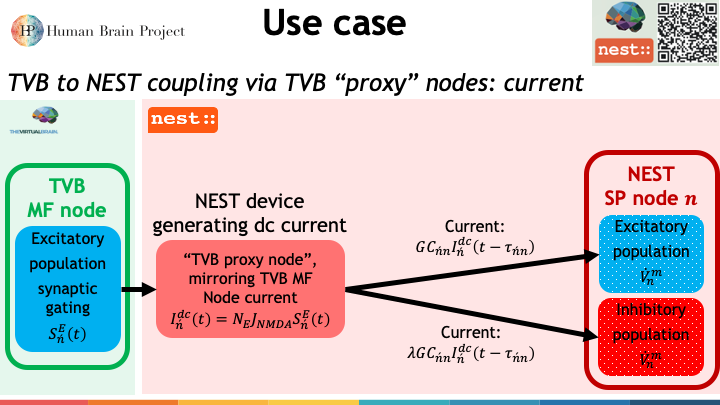

In [4]:
display(Image(filename='./DC.png',  width=1000, unconfined=False))

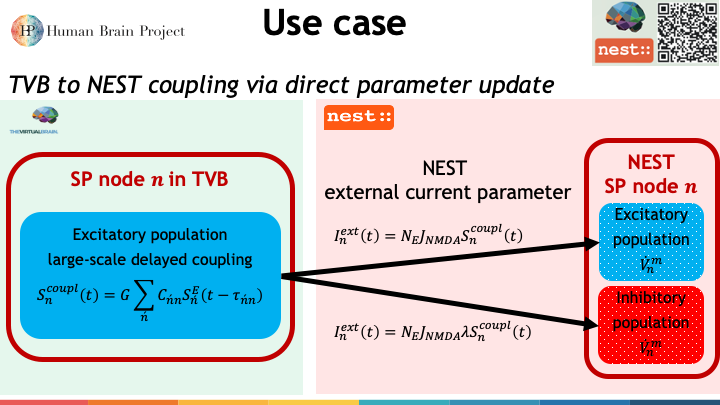

In [5]:
display(Image(filename='./Ie.png',  width=1000, unconfined=False))

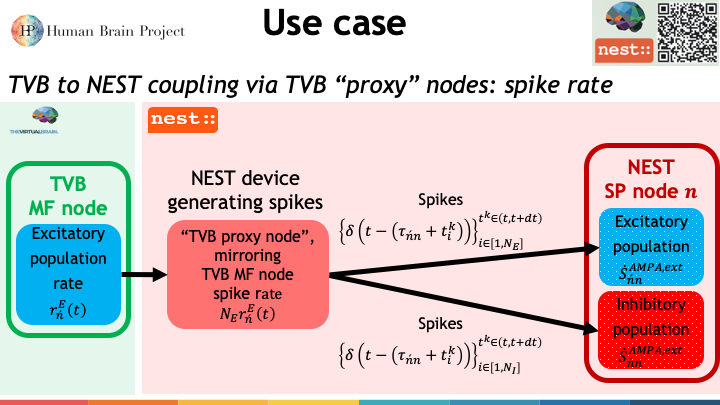

In [6]:
display(Image(filename='./Rate.png',  width=1000, unconfined=False))

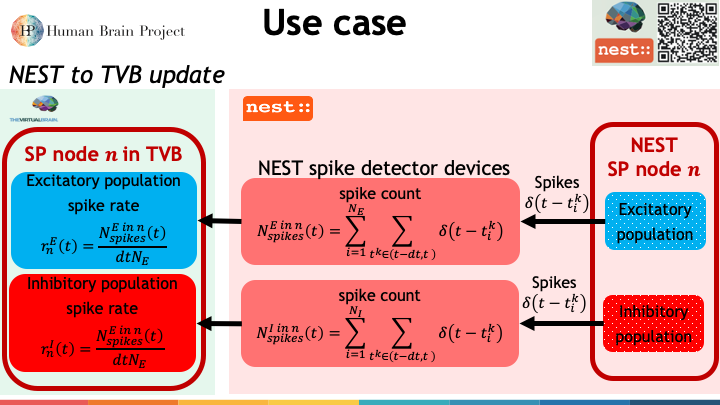

In [7]:
display(Image(filename='./NESTtoTVB.png',  width=1000, unconfined=False))

## Simulator loop

### Simulating several (i.e., 10) NEST time steps for every 1 TVB time step for stable integration

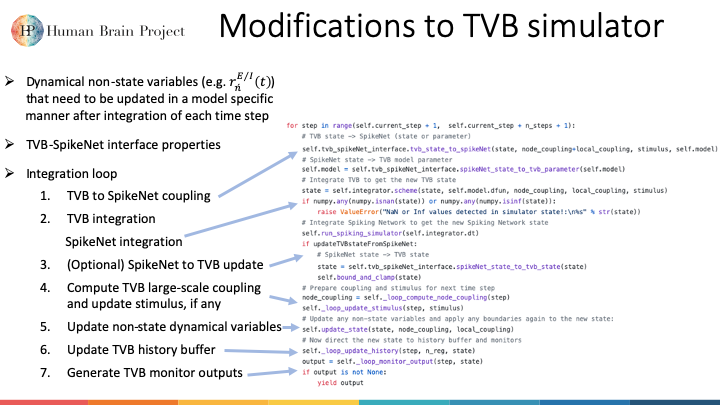

In [8]:
display(Image(filename='./simulator_loop.png',  width=1000, unconfined=False))

In [9]:
from collections import OrderedDict
import time
import numpy as np

from tvb.basic.profile import TvbProfile
TvbProfile.set_profile(TvbProfile.LIBRARY_PROFILE)

from tvb_nest.config import *
config = Config()
config.figures.SHOW_FLAG = True 
config.figures.SAVE_FLAG = True
config.figures.FIG_FORMAT = 'png'

from tvb_multiscale.plot.plotter import Plotter
plotter = Plotter(config)

# For interactive plotting:
# %matplotlib notebook  

# Otherwise:
%matplotlib inline 

2020-01-31 16:26:00,945 - INFO - numexpr.utils - NumExpr defaulting to 6 threads.


/home/docker/packages/tvb-root/scientific_library/tvb/datatypes/surfaces.py:61: UserWarning: Geodesic distance module is unavailable; some functionality for surfaces will be unavailable.
  warnings.warn(msg)


2020-01-31 16:26:01,889 - DEBUG - matplotlib - $HOME=/home/docker
2020-01-31 16:26:01,890 - DEBUG - matplotlib - CONFIGDIR=/home/docker/.config/matplotlib
2020-01-31 16:26:01,894 - DEBUG - matplotlib - matplotlib data path: /usr/share/matplotlib/mpl-data
2020-01-31 16:26:01,894 - DEBUG - matplotlib - loaded rc file /etc/matplotlibrc
2020-01-31 16:26:01,896 - DEBUG - matplotlib - matplotlib version 3.0.2
2020-01-31 16:26:01,897 - DEBUG - matplotlib - interactive is False
2020-01-31 16:26:01,898 - DEBUG - matplotlib - platform is linux
2020-01-31 16:26:01,900 - DEBUG - matplotlib - loaded modules: ['sys', 'builtins', '_frozen_importlib', '_imp', '_thread', '_warnings', '_weakref', 'zipimport', '_frozen_importlib_external', '_io', 'marshal', 'posix', 'encodings', 'codecs', '_codecs', 'encodings.aliases', 'encodings.utf_8', '_signal', '__main__', 'encodings.latin_1', 'io', 'abc', '_abc', '_bootlocale', '_locale', 'site', 'os', 'stat', '_stat', 'posixpath', 'genericpath', 'os.path', '_colle

2020-01-31 16:26:01,944 - DEBUG - matplotlib - CACHEDIR=/home/docker/.cache/matplotlib
2020-01-31 16:26:01,946 - DEBUG - matplotlib.font_manager - Using fontManager instance from /home/docker/.cache/matplotlib/fontlist-v300.json
2020-01-31 16:26:02,048 - DEBUG - matplotlib.pyplot - Loaded backend agg version unknown.
2020-01-31 16:26:02,689 - WARNING - tvb.traits - Field seems mutable and has a default value. Consider using a lambda as a value factory 
   attribute tvb.datatypes.projections.ProjectionMatrix.conductances = Attr(field_type=<class 'dict'>, default={'air': 0.0, 'skin': 1.0, 'skull': 0.01, 'brain': 1.0}, required=False)
2020-01-31 16:26:02,720 - WARNING - tvb.traits - Field seems mutable and has a default value. Consider using a lambda as a value factory 
   attribute tvb.datatypes.time_series.TimeSeries.labels_dimensions = Attr(field_type=<class 'dict'>, default={}, required=True)
2020-01-31 16:26:02,813 - DEBUG - matplotlib.pyplot - Loaded backend module://ipykernel.pylab

## 1. Load structural data <br> (minimally a TVB connectivity)

2020-01-31 16:26:02,880 - DEBUG - matplotlib.colorbar - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7ff520339978>
2020-01-31 16:26:02,881 - DEBUG - matplotlib.colorbar - Using auto colorbar locator on colorbar
2020-01-31 16:26:02,883 - DEBUG - matplotlib.colorbar - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7ff520339978>
2020-01-31 16:26:02,883 - DEBUG - matplotlib.colorbar - Setting pcolormesh
2020-01-31 16:26:02,983 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:26:02,984 - DEBUG - matplotlib.axes._base - not adjusting title pos because title was already placed manually: 1.050000
2020-01-31 16:26:03,007 - DEBUG - matplotlib.font_manager - findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=8.0 to DejaVu Sans ('/usr/share/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf') with score of 0.050000.
2020-01-31 16:26:03,272 - DEBUG - matplotlib.font_manager - findfont: Matching :family=sans

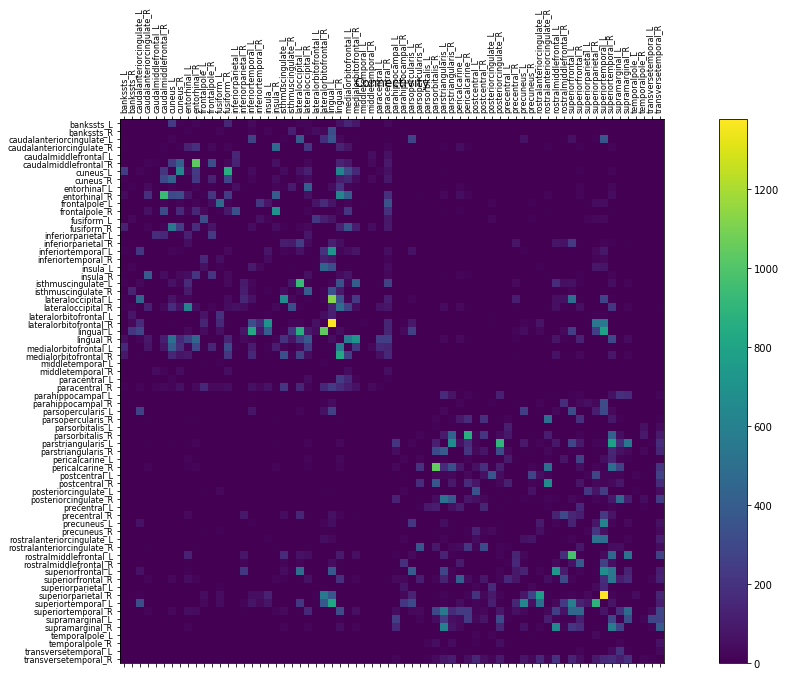

2020-01-31 16:26:04,963 - DEBUG - matplotlib.colorbar - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7ff51b4c0940>
2020-01-31 16:26:04,963 - DEBUG - matplotlib.colorbar - Using auto colorbar locator on colorbar
2020-01-31 16:26:04,964 - DEBUG - matplotlib.colorbar - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7ff51b4c0940>
2020-01-31 16:26:04,965 - DEBUG - matplotlib.colorbar - Setting pcolormesh
2020-01-31 16:26:05,057 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:26:05,058 - DEBUG - matplotlib.axes._base - not adjusting title pos because title was already placed manually: 1.050000
2020-01-31 16:26:05,336 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:26:05,438 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:26:05,439 - DEBUG - matplotlib.axes._base - title position was updated manually, not adjusting
2020-01-31 16:26:05,749 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:26:05,

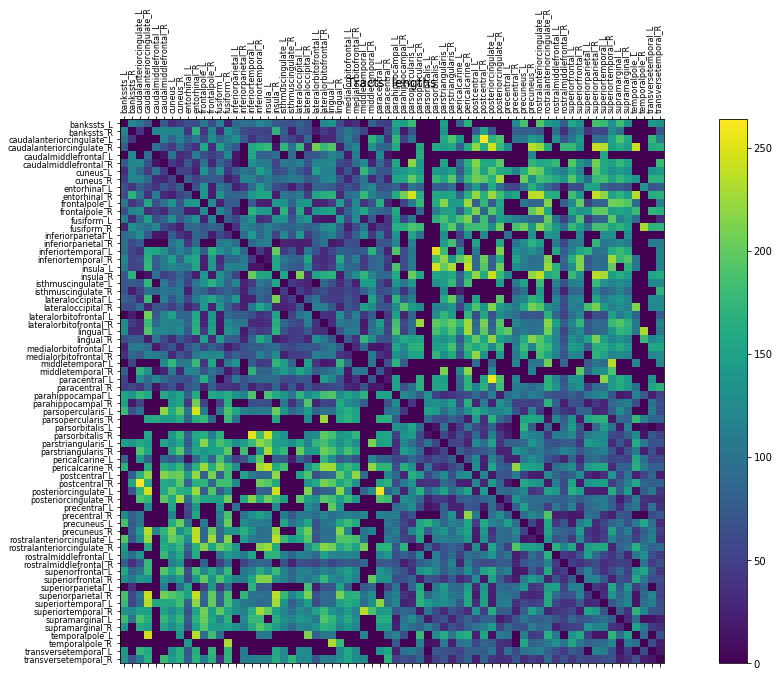

(<Figure size 1440x720 with 2 Axes>,
 <Figure size 1440x720 with 2 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7ff5201dde48>)

In [10]:
from tvb.datatypes.connectivity import Connectivity
connectivity = Connectivity.from_file(config.DEFAULT_CONNECTIVITY_ZIP)
connectivity.configure()
plotter.plot_tvb_connectivity(connectivity)

## 2. Prepare TVB simulator <br> (region mean field model, integrator, monitors etc)

In [11]:
from tvb_multiscale.simulator_tvb.simulator import Simulator
from tvb_multiscale.simulator_tvb.models.reduced_wong_wang_exc_io_inh_i \
    import ReducedWongWangExcIOInhI
from tvb.simulator.monitors import Raw  # , Bold, EEG

# Create a TVB simulator and set all desired inputs
# (connectivity, model, surface, stimuli etc)
# We choose all defaults in this example
simulator = Simulator()
simulator.model = ReducedWongWangExcIOInhI()
simulator.model.J_i = np.array([0.1, ]) # Feedback inhibition
simulator.model.lamda = np.array([0.5, ]) # Feedforward inhibition

simulator.connectivity = connectivity
simulator.integrator.dt = 0.1
simulator.integrator.noise.nsig = np.array([0.001])

mon_raw = Raw(period=simulator.integrator.dt)
# Some extra monitors for neuroimaging measures:
# mon_bold = Bold(period=2000.)
# mon_eeg = EEG(period=simulator.integrator.dt)
simulator.monitors = (mon_raw, )  # mon_bold, mon_eeg

2020-01-31 16:26:07,076 - WARNING - tvb.simulator.common - psutil module not available: no warnings will be issued when a
    simulation may require more memory than available
2020-01-31 16:26:07,087 - WARNING - tvb.traits - default contains values out of the declared domain. Ex 1.0 
   attribute  tvb.simulator.coupling.HyperbolicTangent.b = NArray(label=':math:`b`', dtype=float64, default=array([1.]), dim_names=(), ndim=None, required=True)
2020-01-31 16:26:07,091 - WARNING - tvb.traits - default contains values out of the declared domain. Ex 1.0 
   attribute  tvb.simulator.coupling.Kuramoto.a = NArray(label=':math:`a`', dtype=float64, default=array([1.]), dim_names=(), ndim=None, required=True)
2020-01-31 16:26:07,296 - WARNING - tvb.traits - default contains values out of the declared domain. Ex 1.0 
   attribute  tvb.simulator.models.oscillator.Generic2dOscillator.gamma = NArray(label=':math:`\\gamma`', dtype=float64, default=array([1.]), dim_names=(), ndim=None, required=True)
20

## 3. Build and connect the NEST network model <br> (networks of spiking neural populations for fine-scale <br>regions, stimulation devices, spike detectors etc)

In [12]:
# Select the regions for the fine scale modeling with NEST spiking networks
number_of_regions = simulator.connectivity.region_labels.shape[0]
nest_nodes_ids = []  # the indices of fine scale regions modeled with NEST
# We model parahippocampal cortices (left and right) with NEST
for id in range(number_of_regions):
    if simulator.connectivity.region_labels[id].find("hippo") > 0:
        nest_nodes_ids.append(id)
        
from tvb_nest.nest_models.builders.models.ww_deco2014 \
    import WWDeco2014Builder

# Build a NEST network model with the corresponding builder
# Using all default parameters for this example
nest_model_builder = WWDeco2014Builder(simulator, nest_nodes_ids, config=config)


# or...

# ----------------------------------------------------------------------------------------------------------------
# ----Uncomment below to modify the builder by changing the default options:--------------------------------------
# ----------------------------------------------------------------------------------------------------------------

nest_model_builder.population_order = 100

exc_pop_scale=1.0
inh_pop_scale=0.7
exc_pop_size = int(nest_model_builder.population_order * exc_pop_scale)
inh_pop_size = int(nest_model_builder.population_order * inh_pop_scale)

common_params = {
    "V_th": -50.0,  # mV    
    "V_reset": -55.0,  # mV  
    "E_L": -70.0,  # mV 
    "E_ex": 0.0,   # mV
    "E_in": -70.0,  # mV
    "tau_decay_AMPA": 2.0,    # ms
    "tau_decay_GABA_A": 10.0,  # ms
    "tau_decay_NMDA": 100.0,  # ms
    "tau_rise_NMDA": 2.0,  # ms
    "s_AMPA_ext_max": exc_pop_size*np.ones((nest_model_builder.number_of_nodes, )).astype("f")
    }
nest_model_builder.params_ex = dict(common_params)
nest_model_builder.params_ex.update({
    "C_m": 500.0,  # pF
    "g_L": 25.0,  # nS
    "t_ref": 2.0,  # ms
    "g_AMPA_ext": 3.37,  # nS
    "g_AMPA": 0.065,  # nS 
    "g_NMDA": 0.20,  # nS
    "g_GABA_A": 10.94,  # nS
    "w_E": nest_model_builder.tvb_model.w_p[0],  #w+ in the paper
    "w_I": nest_model_builder.tvb_model.J_i[0],
    "N_E": exc_pop_size-1,
    "N_I": inh_pop_size
    })
nest_model_builder.params_in = dict(common_params)
nest_model_builder.params_in.update({
    "C_m": 200.0,  # pF
    "g_L": 20.0,  # nS
    "t_ref": 1.0,  # ms
    "g_AMPA_ext": 2.59,  # nS
    "g_AMPA": 0.051,  # nS
    "g_NMDA": 0.16,  # nS
    "g_GABA_A": 8.51,  # nS
    "w_E": 1.0, 
    "w_I": 1.0,
    "N_E": exc_pop_size,
    "N_I": inh_pop_size-1
    })

def param_fun(node_index, params, lamda=1.0):
    out_params = dict(params)
    out_params.update({"w_E_ext": lamda*nest_model_builder.tvb_model.G[0] *
                           nest_model_builder.tvb_weights[:,
                                                          list(nest_model_builder.spiking_nodes_ids).index(node_index)]})
    return out_params

# Populations' configurations
# When any of the properties model, params and scale below depends on regions,
# set a handle to a function with
# arguments (region_index=None) returning the corresponding property

nest_model_builder.populations = [
    {"label": "E", "model": nest_model_builder.default_population["model"],
     "nodes": None,  # None means "all"
     "params": lambda node_index: param_fun(node_index, nest_model_builder.params_ex),
     "scale": exc_pop_scale},
    {"label": "I", "model": nest_model_builder.default_population["model"],
     "nodes": None,  # None means "all"
     "params": lambda node_index: param_fun(node_index, nest_model_builder.params_in, 
                                           lamda=nest_model_builder.tvb_model.lamda[0]),
     "scale": 1.0}
  ]

# Within region-node connections
# When any of the properties model, conn_spec, weight, delay, receptor_type below
# set a handle to a function with
# arguments (region_index=None) returning the corresponding property
nest_model_builder.populations_connections = [
     #              ->
    {"source": "E", "target": "E",  # E -> E This is a self-connection for population "E"
     "model": nest_model_builder.default_populations_connection["model"],
     "conn_spec": nest_model_builder.default_populations_connection["conn_spec"],
     "weight": 1.0,
     "delay": nest_model_builder.default_populations_connection["delay"],
     "receptor_type": 0, "nodes": None},  # None means "all"
    {"source": "E", "target": "I",  # E -> I
     "model": nest_model_builder.default_populations_connection["model"],
     "conn_spec": nest_model_builder.default_populations_connection["conn_spec"],
     "weight": 1.0,
     "delay": nest_model_builder.default_populations_connection["delay"],
     "receptor_type": 0, "nodes": None},  # None means "all"
    {"source": "I", "target": "E",  # I -> E
     "model": nest_model_builder.default_populations_connection["model"],
     "conn_spec": nest_model_builder.default_populations_connection["conn_spec"],
     "weight": -1.0,
     "delay": nest_model_builder.default_populations_connection["delay"],
     "receptor_type": 0, "nodes": None},  # None means "all"
    {"source": "I", "target": "I",  # I -> I This is a self-connection for population "I"
     "model": nest_model_builder.default_populations_connection["model"],
     "conn_spec": nest_model_builder.default_populations_connection["conn_spec"],
     "weight": -1.0,
     "delay": nest_model_builder.default_populations_connection["delay"],
     "receptor_type": 0, "nodes": None}  # None means "all"
    ]


# Among/Between region-node connections
# Given that only the AMPA population of one region-node couples to
# all populations of another region-node,
# we need only one connection type
        
# When any of the properties model, conn_spec, weight, delay, receptor_type below
# depends on regions, set a handle to a function with
# arguments (source_region_index=None, target_region_index=None)

from tvb_multiscale.spiking_models.builders.templates import tvb_delay, receptor_by_source_region
    
nest_model_builder.nodes_connections = [
    #              ->
    {"source": "E", "target": ["E"],
     "model": nest_model_builder.default_nodes_connection["model"],
     "conn_spec": nest_model_builder.default_nodes_connection["conn_spec"],
   #  weight scaling the TVB connectivity weight
     "weight": 1.0,
   # additional delay to the one of TVB connectivity
     "delay": lambda source_node, target_node: 
                 tvb_delay(source_node, target_node, nest_model_builder.tvb_delays),  
    # Each region emits spikes in its own port:
     "receptor_type": lambda source_region_index, target_region_index=None: 
                         receptor_by_source_region(source_region_index, target_region_index, start=1),
     "source_nodes": None, "target_nodes": None}  # None means "all"
    ]
if nest_model_builder.tvb_model.lamda[0] > 0:
    nest_model_builder.nodes_connections[0]["target"] += ["I"]
    
# Creating  devices to be able to observe NEST activity:
# Labels have to be different
nest_model_builder.output_devices = []
connections = OrderedDict({})
#          label <- target population
connections["E"] = "E"
connections["I"] = "I"
nest_model_builder.output_devices.append(
    {"model": "spike_detector", "params": {},
     "connections": connections, "nodes": None})  # None means "all"

connections = OrderedDict({})
#               label    <- target population
connections["Excitatory"] = "E"
connections["Inhibitory"] = "I"
params = dict(nest_model_builder.config.nest.NEST_OUTPUT_DEVICES_PARAMS_DEF["multimeter"])
params["interval"] = nest_model_builder.nest_instance.GetKernelStatus("resolution")  # self.monitor_period
params['record_from'] = ["V_m",
                         "s_AMPA", "x_NMDA", "s_NMDA", "s_GABA",
                         "I_AMPA", "I_NMDA", "I_GABA", "I_L", "I_e",
                         "spikes_exc", "spikes_inh"
                        ]
for i_node in range(nest_model_builder.number_of_nodes):
    params['record_from'].append("s_AMPA_ext_%d" % i_node)
    params['record_from'].append("I_AMPA_ext_%d" % i_node)
    params['record_from'].append("spikes_exc_ext_%d" % i_node)

nest_model_builder.output_devices.append(
    {"model": "multimeter", "params": params,
     "connections": connections, "nodes": None})  # None means "all"
    
# ----------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------

nest_network = nest_model_builder.build_spiking_network()


2020-01-31 16:26:08,294 - INFO - tvb_nest.nest_models.builders.base - Loading a NEST instance...
2020-01-31 16:26:08,294 - INFO - tvb_nest.nest_models.builders.base - Loading a NEST instance...
2020-01-31 16:26:08,297 - INFO - tvb_nest.nest_models.builders.base - NEST_INSTALL_DIR: /home/docker/env/neurosci/nest_build
2020-01-31 16:26:08,297 - INFO - tvb_nest.nest_models.builders.base - NEST_INSTALL_DIR: /home/docker/env/neurosci/nest_build
2020-01-31 16:26:08,299 - INFO - tvb_nest.nest_models.builders.base - NEST_DATA_DIR: /home/docker/env/neurosci/nest_build/share/nest
2020-01-31 16:26:08,299 - INFO - tvb_nest.nest_models.builders.base - NEST_DATA_DIR: /home/docker/env/neurosci/nest_build/share/nest
2020-01-31 16:26:08,302 - INFO - tvb_nest.nest_models.builders.base - NEST_DOC_DIR: /home/docker/env/neurosci/nest_build/share/doc/nest
2020-01-31 16:26:08,302 - INFO - tvb_nest.nest_models.builders.base - NEST_DOC_DIR: /home/docker/env/neurosci/nest_build/share/doc/nest
2020-01-31 16:26:0

2020-01-31 16:26:09,272 - INFO - tvb_multiscale.spiking_models.devices - <class 'tvb_multiscale.spiking_models.devices.DeviceSet'> of model multimeter for Excitatory created!
2020-01-31 16:26:09,286 - INFO - tvb_multiscale.spiking_models.devices - <class 'tvb_multiscale.spiking_models.devices.DeviceSet'> of model multimeter for Inhibitory created!
2020-01-31 16:26:09,286 - INFO - tvb_multiscale.spiking_models.devices - <class 'tvb_multiscale.spiking_models.devices.DeviceSet'> of model multimeter for Inhibitory created!
2020-01-31 16:26:09,300 - INFO - tvb_multiscale.spiking_models.network - <class 'tvb_nest.nest_models.network.NESTNetwork'> created!
2020-01-31 16:26:09,300 - INFO - tvb_multiscale.spiking_models.network - <class 'tvb_nest.nest_models.network.NESTNetwork'> created!
2020-01-31 16:26:09,302 - INFO - tvb_nest.nest_models.network - <class 'tvb_nest.nest_models.network.NESTNetwork'> created!
2020-01-31 16:26:09,302 - INFO - tvb_nest.nest_models.network - <class 'tvb_nest.nest

## 4. Build the TVB-NEST interface

In [13]:
from tvb_nest.interfaces.builders.models.ww_deco2014 import WWDeco2014Builder as InterfaceWWDeco2014Builder

# Build a TVB-NEST interface with all the appropriate connections between the
# TVB and NEST modelled regions
# Using all default parameters for this example
tvb_nest_builder = InterfaceWWDeco2014Builder(simulator, nest_network, nest_nodes_ids, 
                                              exclusive_nodes=True, N_E=100)
# or...

# ----------------------------------------------------------------------------------------------------------------
# ----Uncomment below to modify the builder by changing the default options:--------------------------------------
# ----------------------------------------------------------------------------------------------------------------

from tvb_multiscale.spiking_models.builders.templates \
    import random_normal_tvb_weight, tvb_delay, receptor_by_source_region


N_E = 100 # The number of excitatory neurons per region

# TVB -> NEST


# # For directly setting an external current parameter in NEST neurons instantaneously:
# tvb_nest_builder.tvb_to_spikeNet_interfaces = [
#     {"model": "current",  "parameter": "I_e",
# # ---------Properties potentially set as function handles with args (nest_node_id=None)---------------------------
#      "interface_weights": 1.0 * N_E,
# # ----------------------------------------------------------------------------------------------------------------
# #                  TVB sv -> NEST population
#      "connections": {"S_e": ["E"]},
#      "nodes": None}]  # None means all here
# if tvb_nest_builder.tvb_model.lamda[0] > 0.0:
#     # Coupling to inhibitory populations as well (feedforward inhibition):
#     tvb_nest_builder.tvb_to_spikeNet_interfaces.append(
#     {
#         "model": "current", "parameter": "I_e",
# # ---------Properties potentially set as function handles with args (nest_node_id=None)---------------------------
#         "interface_weights": 1.0 * N_E * tvb_nest_builder.tvb_model.lamda[0],
# # ----------------------------------------------------------------------------------------------------------------
# #                     TVB sv -> NEST population
#         "connections": {"S_e": ["I"]},
#         "nodes": None}
#     )
    
            
# # For injecting current to NEST neurons via dc generators acting as TVB proxy nodes with TVB delays:
# tvb_nest_builder.tvb_to_spikeNet_interfaces = [
#     {"model": "dc_generator", "params": {},
# # ---------Properties potentially set as function handles with args (nest_node_id=None)---------------------------
# #   Applied outside NEST for each interface device
#      "interface_weights": 1.0 * N_E,
# # -------Properties potentially set as function handles with args (tvb_node_id=None, nest_node_id=None)-----------
# #    To multiply TVB connectivity weight:
#      "weights": lambda tvb_node_id, nest_node_id: 
#                          random_normal_tvb_weight(tvb_node_id, nest_node_id, 
#                                                   simulator.model.G[0]*
#                                                   tvb_nest_builder.tvb_weights, 
#                                                   sigma=0.1),
# #    To add to TVB connectivity delay:
#      "delays": lambda tvb_node_id, nest_node_id: 
#                     tvb_delay(tvb_node_id, nest_node_id, tvb_nest_builder.tvb_delays),
# # ----------------------------------------------------------------------------------------------------------------
# #    TVB sv -> NEST population
#      "connections": {"S_e": ["E"]},
#      "source_nodes": None, "target_nodes": None}]  # None means all here

# if tvb_nest_builder.tvb_model.lamda[0] > 0.0:
#     # Coupling to inhibitory populations as well (feedforward inhibition):
#     tvb_nest_builder.tvb_to_spikeNet_interfaces.append(
#                          {"model": "dc_generator", "params": {},
#                     # ---------Properties potentially set as function handles with args (nest_node_id=None)---------------------------
#                     #   Applied outside NEST for each interface device
#                          "interface_weights": 1.0 * N_E,
#                     # -------Properties potentially set as function handles with args (tvb_node_id=None, nest_node_id=None)-----------
#                     #    To multiply TVB connectivity weight:
#                          "weights": lambda tvb_node_id, nest_node_id: 
#                                              random_normal_tvb_weight(tvb_node_id, nest_node_id, 
#                                                                       simulator.model.G[0]*
#                                                                       simulator.model.lamda[0]*
#                                                                       tvb_nest_builder.tvb_weights, sigma=0.1),
#                     #    To add to TVB connectivity delay:
#                          "delays": lambda tvb_node_id, nest_node_id: 
#                                         tvb_delay(tvb_node_id, nest_node_id, tvb_nest_builder.tvb_delays),
#                     # ----------------------------------------------------------------------------------------------------------------
#                     #    TVB sv -> NEST population
#                          "connections": {"S_e": ["I"]},
#                          "source_nodes": None, "target_nodes": None}
#                     )



# For spike transmission from TVB to NEST devices acting as TVB proxy nodes with TVB delays:
tvb_nest_builder.tvb_to_spikeNet_interfaces = [
    {"model": "inhomogeneous_poisson_generator",
     "params": {"allow_offgrid_times": False},
# # ---------Properties potentially set as function handles with args (nest_node_id=None)-------------------------
     "interface_weights": 1.0 * N_E, 
# Applied outside NEST for each interface device
# -------Properties potentially set as function handles with args (tvb_node_id=None, nest_node_id=None)-----------
#   To multiply TVB connectivity weight:
    "weights": 1.0,
#                                     To add to TVB connectivity delay:
    "delays": lambda tvb_node_id, nest_node_id: 
                 tvb_delay(tvb_node_id, nest_node_id, tvb_nest_builder.tvb_delays),
    "receptor_types": lambda tvb_node_id, nest_node_id: 
                         receptor_by_source_region(tvb_node_id, nest_node_id, start=1),
    # --------------------------------------------------------------------------------------------------------------
    #             TVB sv -> NEST population
    "connections": {"R_e": ["E"]},
    "source_nodes": None, "target_nodes": None}]  # None means all here

if tvb_nest_builder.tvb_model.lamda[0] > 0.0:
#       Coupling towards the inhibitory population as well:
    tvb_nest_builder.tvb_to_spikeNet_interfaces[0]["connections"]["R_e"] += ["I"]
                
        
        
# NEST -> TVB:
# Use S_e and S_i instead of r_e and r_i
# for transmitting to the TVB state variables directly
connections = OrderedDict()
#            TVB <- NEST
connections["R_e"] = ["E"]
connections["R_i"] = ["I"]
tvb_nest_builder.nest_to_tvb_interfaces = [
    {"model": "spike_detector", "params": {},
# ------------------Properties potentially set as function handles with args (nest_node_id=None)--------------------
     "weights": 1.0, "delays": 0.0,
# -----------------------------------------------------------------------------------------------------------------
     "connections": connections, "nodes": None}]  # None means all here

tvb_nest_builder.w_tvb_to_current = 1000 * tvb_nest_builder.tvb_model.J_N[0]  # (nA of TVB -> pA of NEST)
# WongWang model parameter r is in Hz, just like poisson_generator assumes in NEST:
tvb_nest_builder.w_tvb_to_spike_rate = 1.0
# We return from a NEST spike_detector the ratio number_of_population_spikes / number_of_population_neurons
# for every TVB time step, which is usually a quantity in the range [0.0, 1.0],
# as long as a neuron cannot fire twice during a TVB time step, i.e.,
# as long as the TVB time step (usually 0.001 to 0.1 ms)
# is smaller than the neurons' refractory time, t_ref (usually 1-2 ms)
# For conversion to a rate, one has to do:
# w_spikes_to_tvb = 1/tvb_dt, to get it in spikes/ms, and
# w_spikes_to_tvb = 1000/tvb_dt, to get it in Hz
# given WongWang model parameter r is in Hz but tvb dt is in ms:
tvb_nest_builder.w_spikes_to_tvb = 1000.0 / tvb_nest_builder.tvb_dt

# ----------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------
# ----------------------------------------------------------------------------------------------------------------

tvb_nest_model = tvb_nest_builder.build_interface()

2020-01-31 16:26:09,548 - WARNING - tvb.traits - Field seems mutable and has a default value. Consider using a lambda as a value factory 
   attribute tvb.simulator.models.wilson_cowan.WilsonCowan.state_variable_range = Final(field_type=<class 'dict'>, default={'E': array([0., 1.]), 'I': array([0., 1.])}, required=True)
2020-01-31 16:26:09,552 - WARNING - tvb.traits - Field seems mutable and has a default value. Consider using a lambda as a value factory 
   attribute tvb_multiscale.simulator_tvb.models.wilson_cowan_constraint.WilsonCowan.state_variable_boundaries = Final(field_type=<class 'dict'>, default={'E': array([0., 1.]), 'I': array([0., 1.])}, required=True)
2020-01-31 16:26:09,552 - WARNING - tvb.traits - Field seems mutable and has a default value. Consider using a lambda as a value factory 
   attribute tvb_multiscale.simulator_tvb.models.wilson_cowan_constraint.WilsonCowan.state_variable_range = Final(field_type=<class 'dict'>, default={'E': array([0., 1.]), 'I': array([0.,

## 5. Configure simulator, simulate, gather results

In [14]:
# Configure the simulator with the TVB-NEST interface...
simulator.configure(tvb_spikeNet_interface=tvb_nest_model)
# ...and simulate!
t = time.time()
results = simulator.run(simulation_length=200.0)
# Integrate NEST one more NEST time step so that multimeters get the last time point
# unless you plan to continue simulation later
simulator.run_spiking_simulator(simulator.tvb_spikeNet_interface.nest_instance.GetKernelStatus("resolution"))
print("\nSimulated in %f secs!" % (time.time() - t))

2020-01-31 16:26:10,516 - DEBUG - tvb_multiscale.simulator_tvb.models.reduced_wong_wang_exc_io_inh_i - building observer with code:
def observe(state):
    S_e,S_i,R_e,R_i = state
    return numpy.array([S_e,S_i,R_e,R_i])
2020-01-31 16:26:10,520 - INFO - tvb_multiscale.simulator_tvb.simulator - Region simulation with 68 ROI nodes
2020-01-31 16:26:10,520 - INFO - tvb_multiscale.simulator_tvb.simulator - Region simulation with 68 ROI nodes
2020-01-31 16:26:10,524 - DEBUG - tvb_multiscale.simulator_tvb.simulator - Estimated history shape is (879.3333333333334, 4, 68, 1)
2020-01-31 16:26:10,524 - DEBUG - tvb_multiscale.simulator_tvb.simulator - Estimated history shape is (879.3333333333334, 4, 68, 1)
2020-01-31 16:26:10,527 - INFO - tvb_multiscale.simulator_tvb.simulator - Memory requirement estimate: simulation will need about 4.4 MB
2020-01-31 16:26:10,527 - INFO - tvb_multiscale.simulator_tvb.simulator - Memory requirement estimate: simulation will need about 4.4 MB
2020-01-31 16:26:10,

In [15]:
# Clean-up NEST simulation
simulator.tvb_spikeNet_interface.nest_instance.Cleanup()

# Gather the results
t = results[0][0]
source = results[0][1]

# Put the results in a Timeseries instance
from tvb_scripts.time_series.model import TimeSeriesRegion

source_ts = TimeSeriesRegion(source, time=t,
               connectivity=simulator.connectivity,
               labels_ordering=["Time", "State Variable", "Region", "Neurons"],
               labels_dimensions=
                    {"State Variable": ["S_e", "S_i", "R_e", "R_i"],
                     "Region": simulator.connectivity.region_labels.tolist()},
               sample_period=simulator.integrator.dt)
source_ts.configure()
source_ts

,value
Dimensions,"['Time', 'State Variable', 'Region', 'Neurons']"
Length,200.0
Region Mapping,None
Region Mapping Volume,None
Sample period,0.1
Source Connectivity,Connectivity gid: c20ad566-802c-448f-97d4-1e1871bea492
Time units,ms
Time-series name,TimeSeriesRegion gid: db204410-8e18-4d1f-b76e-3f7e21ef998f
Time-series type,TimeSeriesRegion
"[min, median, max]","[0, 1, 6500]"


In [16]:
S_e = source_ts.get_state_variables("S_e")
S_i = source_ts.get_state_variables("S_i")
R_e = source_ts.get_state_variables("R_e")
R_i = source_ts.get_state_variables("R_i")

## Plot results

2020-01-31 16:28:06,918 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:07,313 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:07,522 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:07,825 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:08,073 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:08,226 - DEBUG - matplotlib.axes._base - update_title_pos


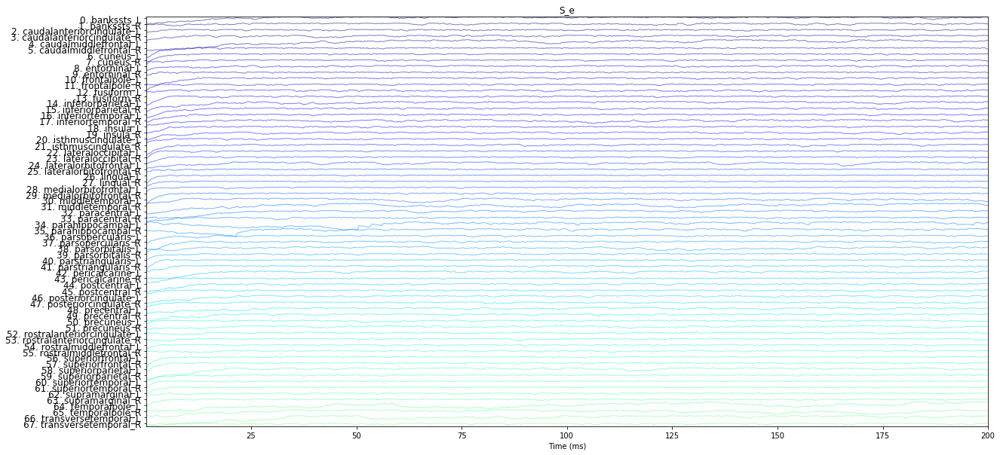

2020-01-31 16:28:08,642 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:08,981 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:28:09,172 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:09,449 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:09,686 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:09,842 - DEBUG - matplotlib.axes._base - update_title_pos


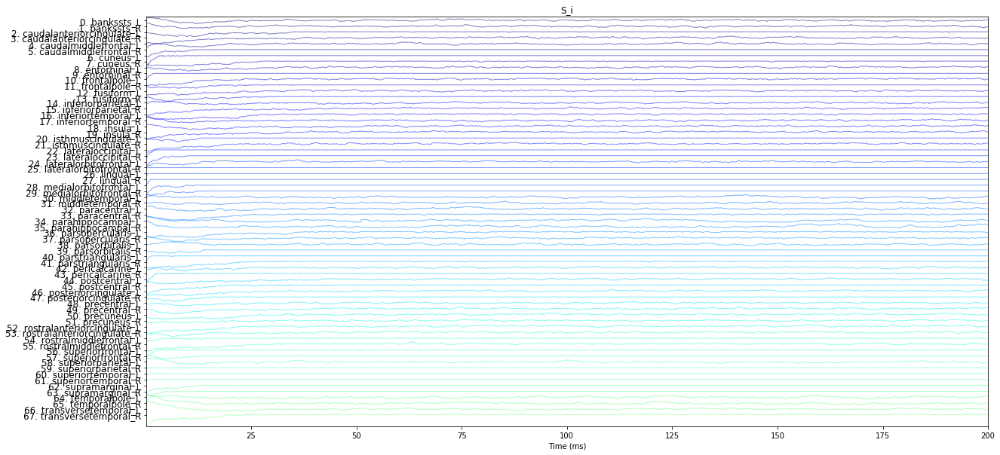

2020-01-31 16:28:10,235 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:10,504 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:28:10,676 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:10,928 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:11,173 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:11,326 - DEBUG - matplotlib.axes._base - update_title_pos


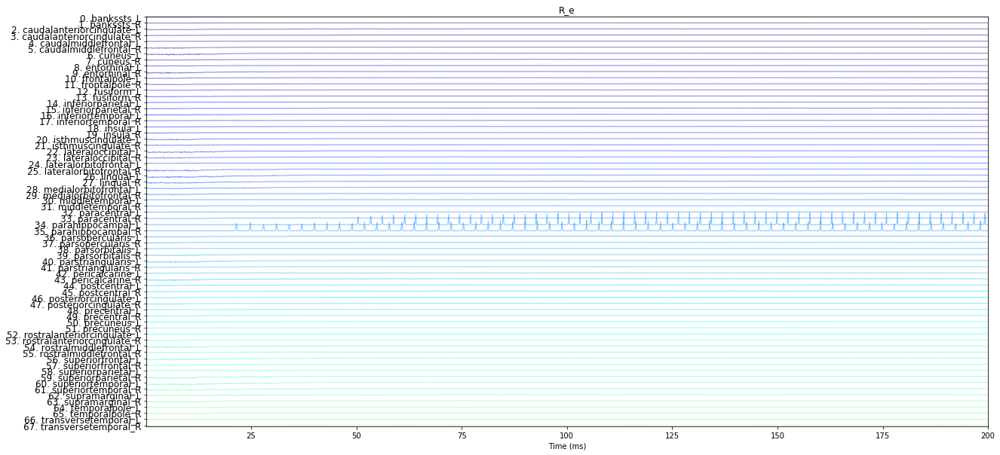

2020-01-31 16:28:11,678 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:12,029 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:28:12,220 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:12,510 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:12,759 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:12,915 - DEBUG - matplotlib.axes._base - update_title_pos


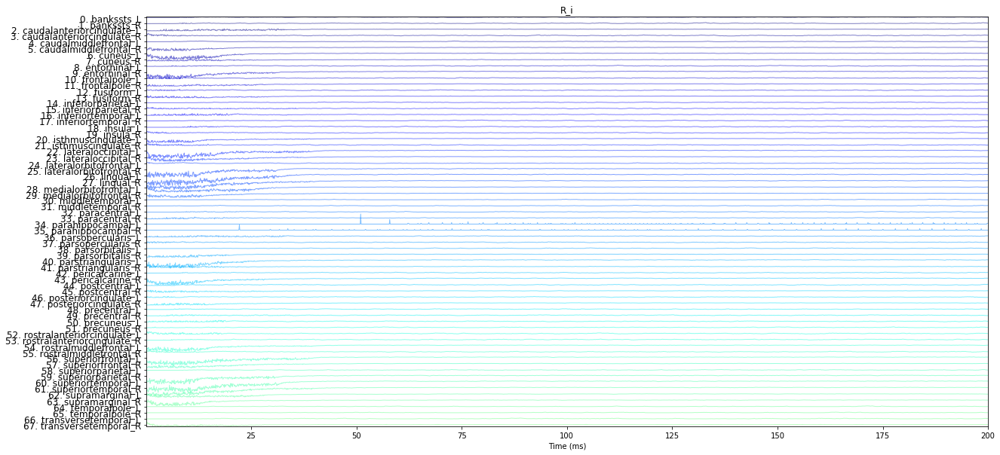

<Figure size 432x288 with 0 Axes>

In [17]:
# For raster plot:
plotter.plot_raster(S_e, title="Region S_e Time Series Raster", figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_raster(S_i, title="Region S_i Time Series Raster", figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_raster(R_e, title="Region R_e Time Series Raster", figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_raster(R_i, title="Region R_i Time Series Raster", figsize=config.figures.NOTEBOOK_SIZE);

2020-01-31 16:28:13,327 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:13,679 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:13,855 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:14,137 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:14,182 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:14,213 - DEBUG - matplotlib.axes._base - update_title_pos


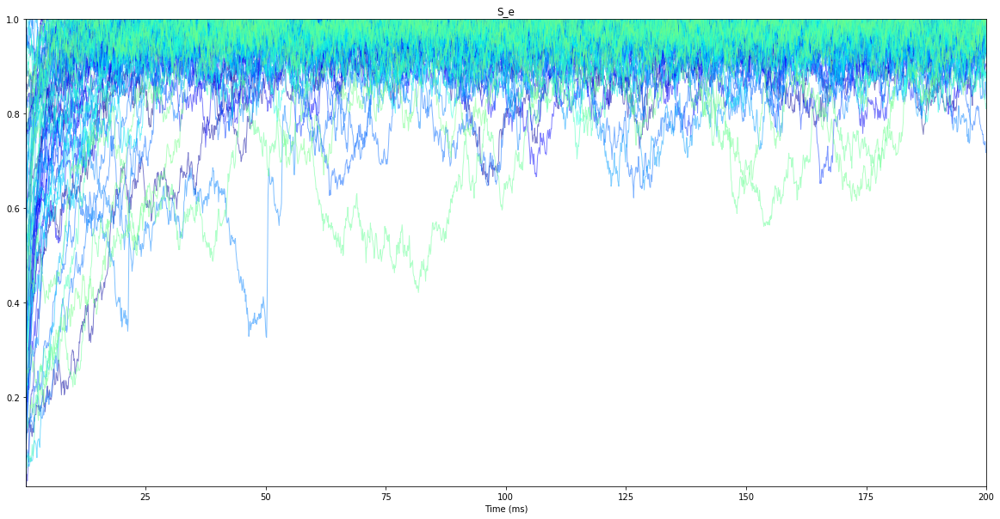

2020-01-31 16:28:14,579 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:15,038 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:28:15,179 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:15,509 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:15,553 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:15,583 - DEBUG - matplotlib.axes._base - update_title_pos


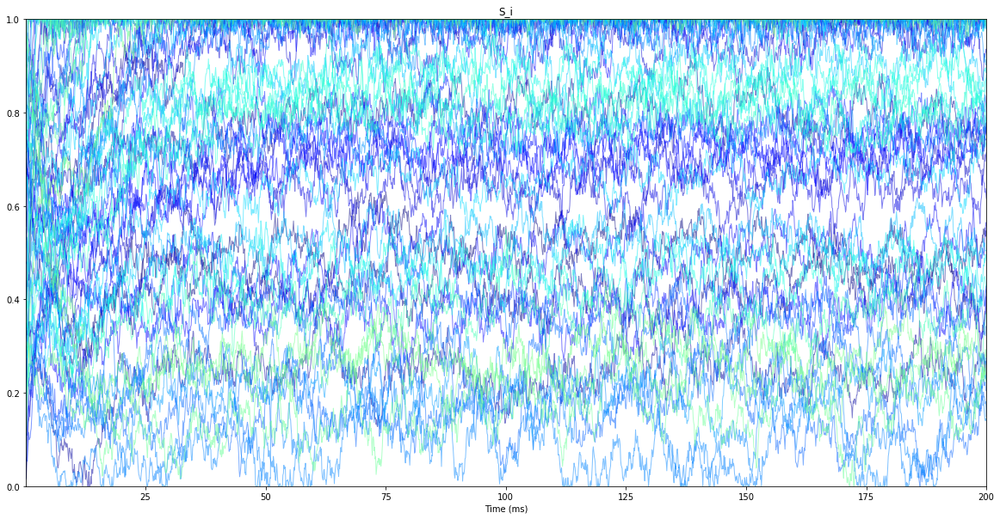

2020-01-31 16:28:16,022 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:16,295 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:28:16,401 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:16,594 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:16,641 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:16,669 - DEBUG - matplotlib.axes._base - update_title_pos


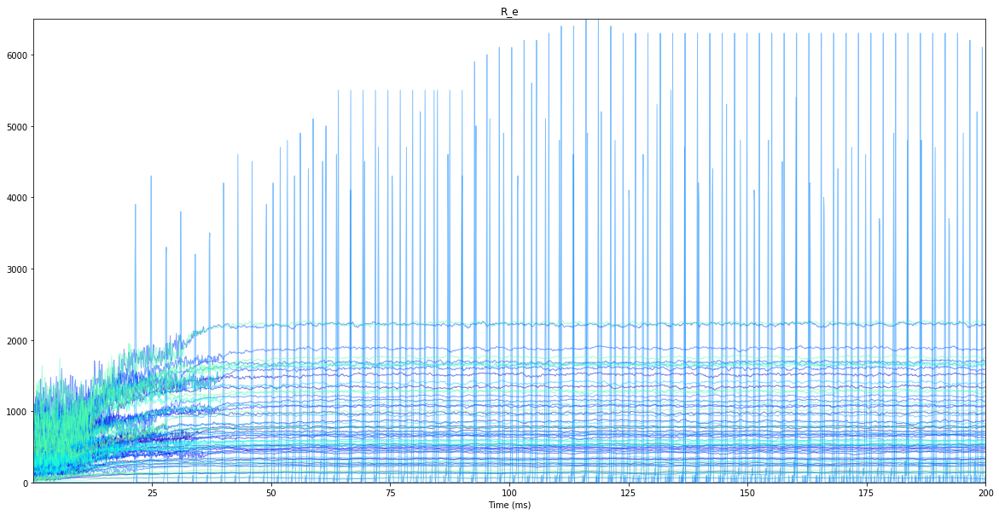

2020-01-31 16:28:17,055 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:17,388 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:28:17,583 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:18,018 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:18,090 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:18,140 - DEBUG - matplotlib.axes._base - update_title_pos


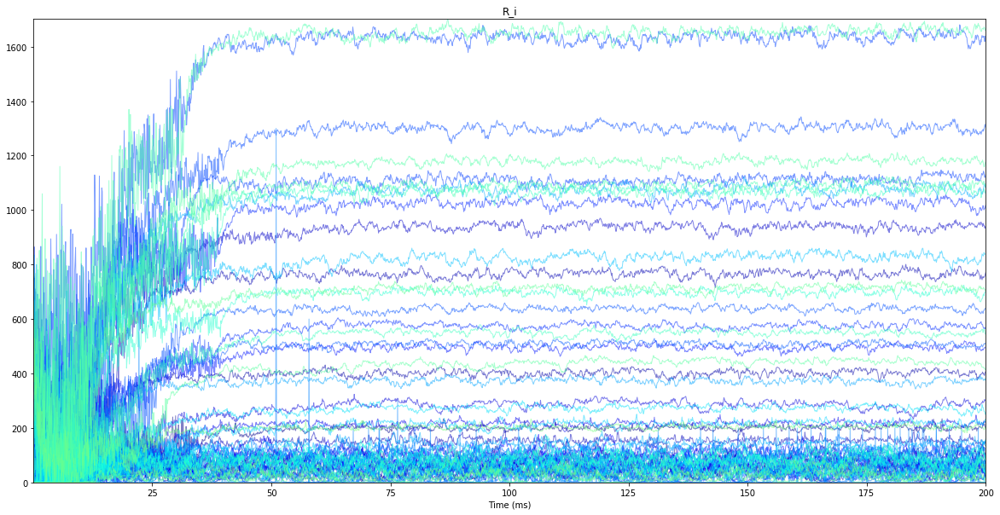

<Figure size 432x288 with 0 Axes>

In [18]:
# For timeseries plot:
plotter.plot_timeseries(S_e, title="Region S_e Time Series Raster", figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_timeseries(S_i, title="Region S_i Time Series Raster", figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_timeseries(R_e, title="Region R_e Time Series Raster", figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_timeseries(R_i, title="Region R_i Time Series Raster", figsize=config.figures.NOTEBOOK_SIZE);

In [19]:
# # For timeseries plot:
# plotter.plot_timeseries(S_e.get_subspace(tvb_nest_model.spiking_nodes_ids), 
#                         title="Region S_e Time Series", 
#                         figsize=config.figures.NOTEBOOK_SIZE);
# plotter.plot_timeseries(S_i.get_subspace(tvb_nest_model.spiking_nodes_ids), 
#                         title="Region S_i Time Series", 
#                         figsize=config.figures.NOTEBOOK_SIZE);
# plotter.plot_timeseries(R_e.get_subspace(tvb_nest_model.spiking_nodes_ids), 
#                         title="Region R_e Time Series", 
#                         figsize=config.figures.NOTEBOOK_SIZE);
# plotter.plot_timeseries(R_i.get_subspace(tvb_nest_model.spiking_nodes_ids), 
#                         title="Region R_i Time Series", 
#                         figsize=config.figures.NOTEBOOK_SIZE);

2020-01-31 16:28:18,541 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:18,670 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:18,693 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:18,791 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:18,814 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:18,827 - DEBUG - matplotlib.axes._base - update_title_pos


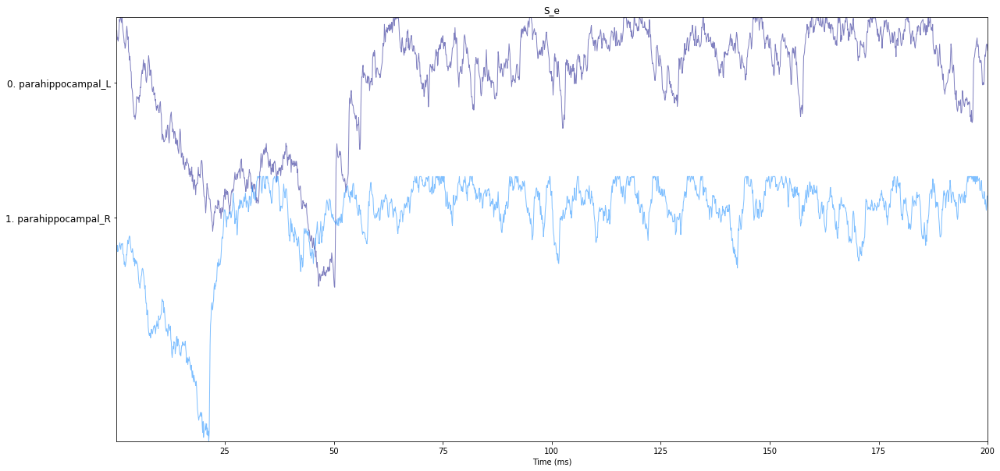

2020-01-31 16:28:18,972 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:19,161 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:28:19,211 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:19,393 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:19,426 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:19,444 - DEBUG - matplotlib.axes._base - update_title_pos


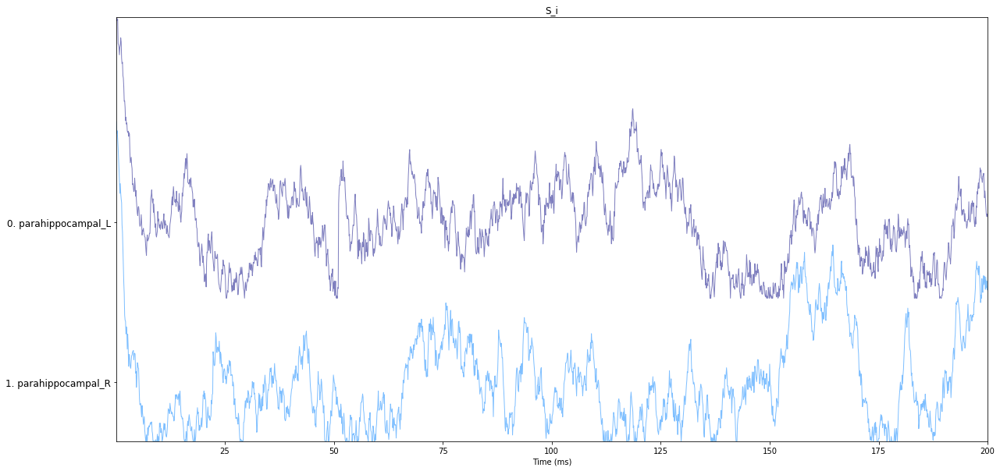

2020-01-31 16:28:19,613 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:19,735 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:28:19,771 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:19,890 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:19,916 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:19,931 - DEBUG - matplotlib.axes._base - update_title_pos


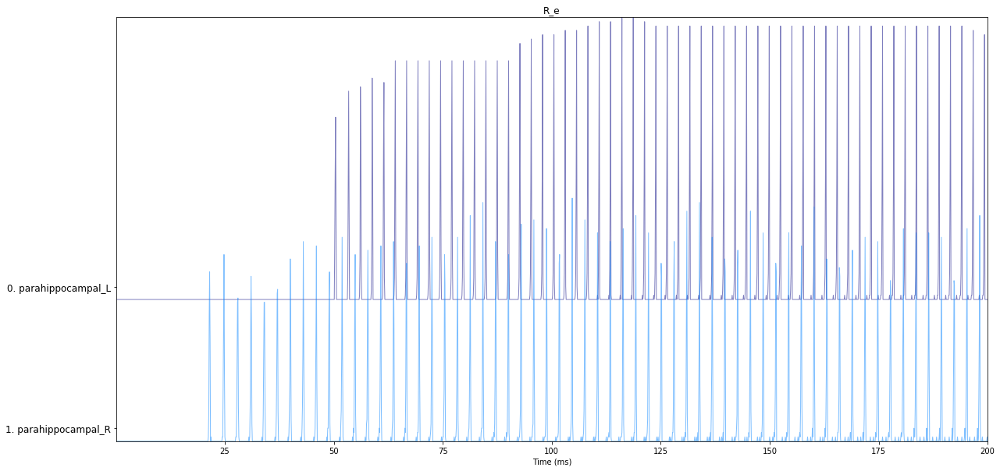

2020-01-31 16:28:20,047 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:20,128 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:28:20,150 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:20,225 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:20,246 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:28:20,257 - DEBUG - matplotlib.axes._base - update_title_pos


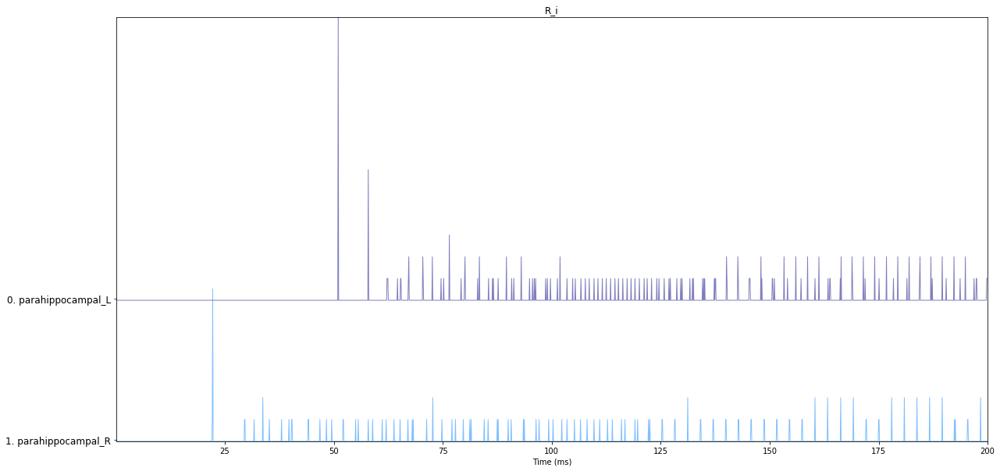

<Figure size 432x288 with 0 Axes>

In [20]:
# For raster plot:
plotter.plot_raster(S_e.get_subspace(tvb_nest_model.spiking_nodes_ids), 
                    title="Region S_e Time Series Raster", 
                    figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_raster(S_i.get_subspace(tvb_nest_model.spiking_nodes_ids), 
                    title="Region S_i Time Series Raster", 
                    figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_raster(R_e.get_subspace(tvb_nest_model.spiking_nodes_ids), 
                    title="Region R_e Time Series Raster", 
                    figsize=config.figures.NOTEBOOK_SIZE);
plotter.plot_raster(R_i.get_subspace(tvb_nest_model.spiking_nodes_ids), 
                        title="Region R_i Time Series Raster", 
                        figsize=config.figures.NOTEBOOK_SIZE);

### Interactive time series plot

In [21]:
# # ...interactively as well
# # For interactive plotting:
# %matplotlib notebook 
# # Use this to skip completely the tvb-scripts plotter
# # from tvb.simulator.plot.timeseries_interactive import TimeSeriesInteractive
# # tvb_plotter = TimeSeriesInteractive(time_series=source_ts._tvb)
# # tvb_plotter.configure()
# # tvb_plotter.show()
# plotter.plot_timeseries_interactive(source_ts)

### Plot population mean membrane potential time series

In [22]:
%matplotlib inline 
# Plot NEST multimeter variables
multimeter_mean_data = tvb_nest_model.get_mean_data_from_multimeter_to_TVBTimeSeries()
# print(multimeter_mean_data)
# print(multimeter_mean_data.variables_labels)

2020-01-31 16:28:20,339 - DEBUG - matplotlib.pyplot - Loaded backend module://ipykernel.pylab.backend_inline version unknown.


In [23]:
# Substitute the per-region synaptic variables with their sums to reduce outputs:

s_AMPA_ext = multimeter_mean_data.get_state_variables_by_label(
            ['s_AMPA_ext_%d' % node_id for node_id in range(tvb_nest_model.number_of_nodes)], 
            title="Mean population s_AMPA_ext from NEST multimeter")
I_AMPA_ext = multimeter_mean_data.get_state_variables_by_label(
            ['I_AMPA_ext_%d' % node_id for node_id in range(tvb_nest_model.number_of_nodes)], 
            title="Mean population I_AMPA_ext from NEST multimeter")
spikes_exc_ext = multimeter_mean_data.get_state_variables_by_label(
                ['spikes_exc_ext_%d' % node_id for node_id in range(tvb_nest_model.number_of_nodes)], 
                title="Mean population spikes_exc_ext from NEST multimeter")
s_AMPA_ext_nest_nodes = s_AMPA_ext.get_state_variables_by_label(
                        ['s_AMPA_ext_%d' % node_id for node_id in tvb_nest_model.spiking_nodes_ids], 
                        title="Mean population s_AMPA_ext_nest_nodes from NEST multimeter")
I_AMPA_ext_nest_nodes = I_AMPA_ext.get_state_variables_by_label(
                        ['I_AMPA_ext_%d' % node_id for node_id in tvb_nest_model.spiking_nodes_ids], 
                        title="Mean population I_AMPA_ext_nest_nodes from NEST multimeter")
spikes_exc_ext_nest_nodes = spikes_exc_ext.get_state_variables_by_label(
                            ['spikes_exc_ext_%d' % node_id for node_id in tvb_nest_model.spiking_nodes_ids], 
                            title="Mean population spikes_exc_ext_nest_nodes from NEST multimeter")

from tvb_scripts.time_series.service import TimeSeriesService
ts_service = TimeSeriesService()
s_AMPA_ext_tot = ts_service.sum_across_dimension(s_AMPA_ext, 1, 
                                                 title="Mean population s_AMPA_ext_tot from NEST multimeter")
s_AMPA_ext_tot.labels_dimensions["Variable"] = ["s_AMPA_ext_tot"]
I_AMPA_ext_tot = ts_service.sum_across_dimension(I_AMPA_ext, 1, 
                                                 title="Mean population I_AMPA_ext_tot from NEST multimeter")
I_AMPA_ext_tot.labels_dimensions["Variable"] = ["I_AMPA_ext_tot"]
spikes_exc_ext_tot = ts_service.sum_across_dimension(spikes_exc_ext, 1, 
                                                     title="Mean population spikes_exc_ext_tot from NEST multimeter")
spikes_exc_ext_tot.labels_dimensions["Variable"] = ["spikes_exc_ext_tot"]

multimeter_mean_data_ext = \
    ts_service.concatenate_variables([spikes_exc_ext_tot, s_AMPA_ext_tot, I_AMPA_ext_tot, 
                                      spikes_exc_ext_nest_nodes, s_AMPA_ext_nest_nodes, I_AMPA_ext_nest_nodes])

multimeter_mean_data_exc = multimeter_mean_data.get_state_variables_by_label(
            ['spikes_exc', 's_AMPA', 'I_AMPA', 'x_NMDA', 's_NMDA', 'I_NMDA'], 
            title="Mean exciatory synapse data from NEST multimeter")
    
multimeter_mean_data_inh = multimeter_mean_data.get_state_variables_by_label(
            ['spikes_inh', 's_GABA', 'I_GABA'], 
           title="Mean inhibitory synapse data from NEST multimeter")
    
multimeter_mean_data_neuron = multimeter_mean_data.get_state_variables_by_label(
            ['V_m', 'I_L', 'I_e'], 
            title="Mean external synapse data from NEST multimeter")

In [24]:
# for data, label in zip([multimeter_mean_data_neuron, multimeter_mean_data_exc,
#                         multimeter_mean_data_inh, multimeter_mean_data_ext], 
#                        ["", " Excitatory synapses ", " Inhibitory synapses ", " External synapses "]):
#     plotter.plot_multimeter_raster(data, plot_per_variable=True,
#                                    time_series_class=TimeSeriesRegion, 
#                                    time_series_args={}, var_pop_join_str=" - ", 
#                                    default_population_label="population",
#                                    title="NEST region %stime series raster" % label)

2020-01-31 16:29:51,060 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:51,091 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:51,220 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:51,241 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:51,265 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:51,285 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:51,385 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:51,404 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:51,434 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:51,456 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:51,476 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:51,505 - DEBUG - matplotlib.axes._base - update_title_pos


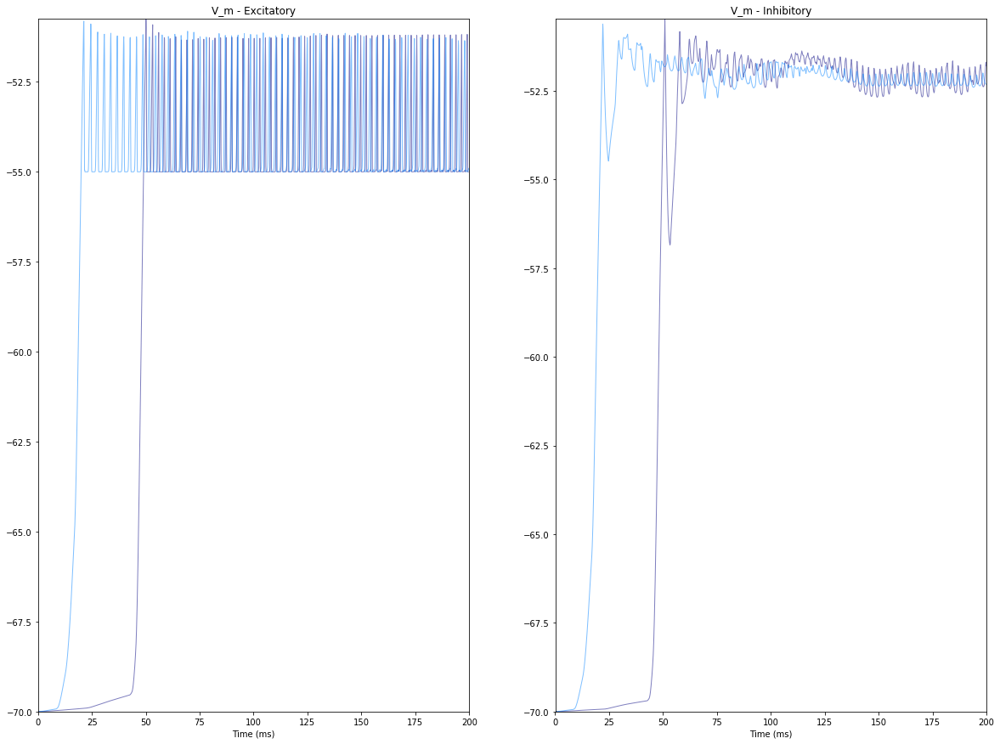

2020-01-31 16:29:51,613 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:51,642 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:51,769 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:51,794 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:29:51,820 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:51,840 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:51,957 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:51,973 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:52,007 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:52,025 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:52,044 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:52,069 - DEBUG - matplotlib.axes._base - update_title_pos


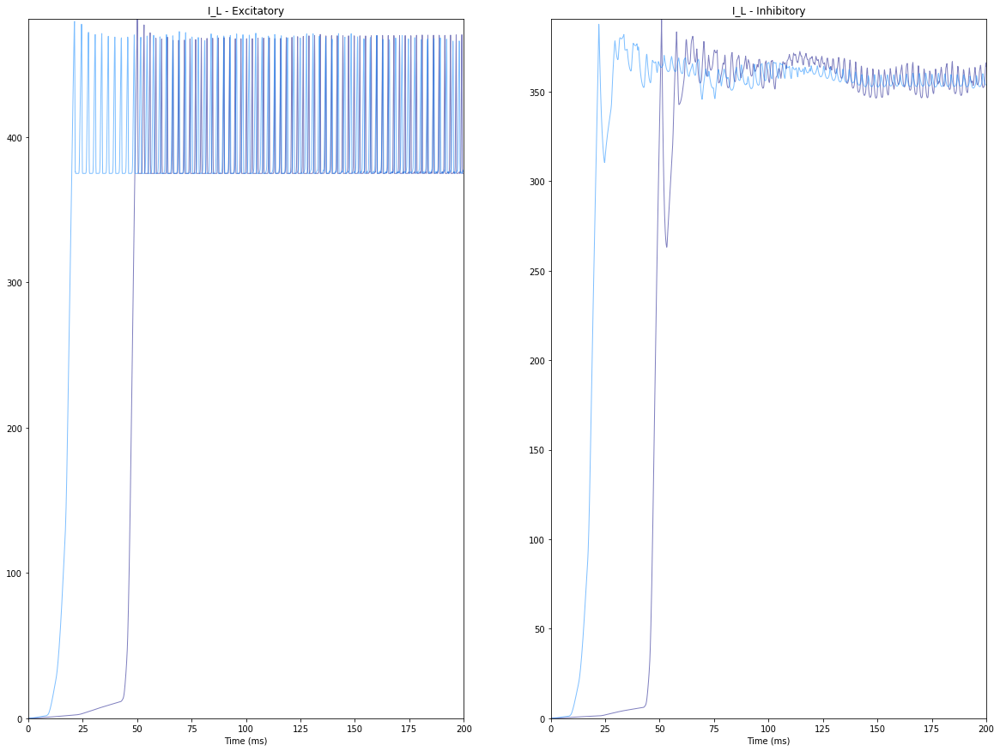

2020-01-31 16:29:52,181 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:52,216 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:52,313 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:52,328 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:29:52,353 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:52,368 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:52,447 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:52,465 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:52,493 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:52,520 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:52,540 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:52,561 - DEBUG - matplotlib.axes._base - update_title_pos


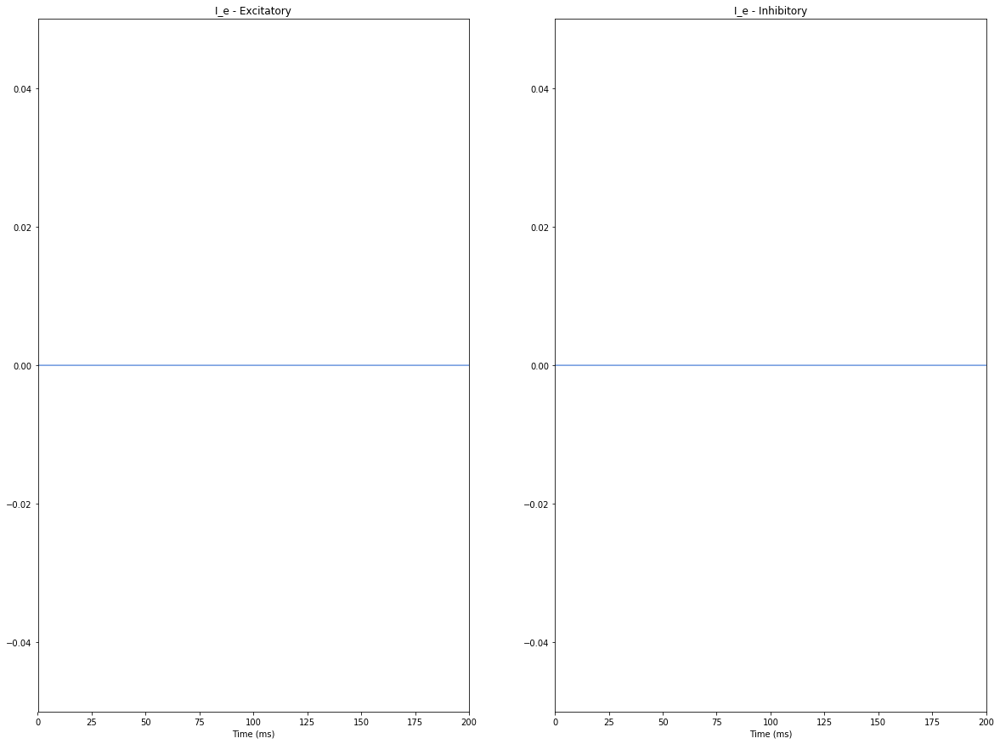

2020-01-31 16:29:52,654 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:52,690 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:52,807 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:52,836 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:29:52,869 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:52,898 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:53,000 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:53,018 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:53,048 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:53,065 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:53,082 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:53,112 - DEBUG - matplotlib.axes._base - update_title_pos


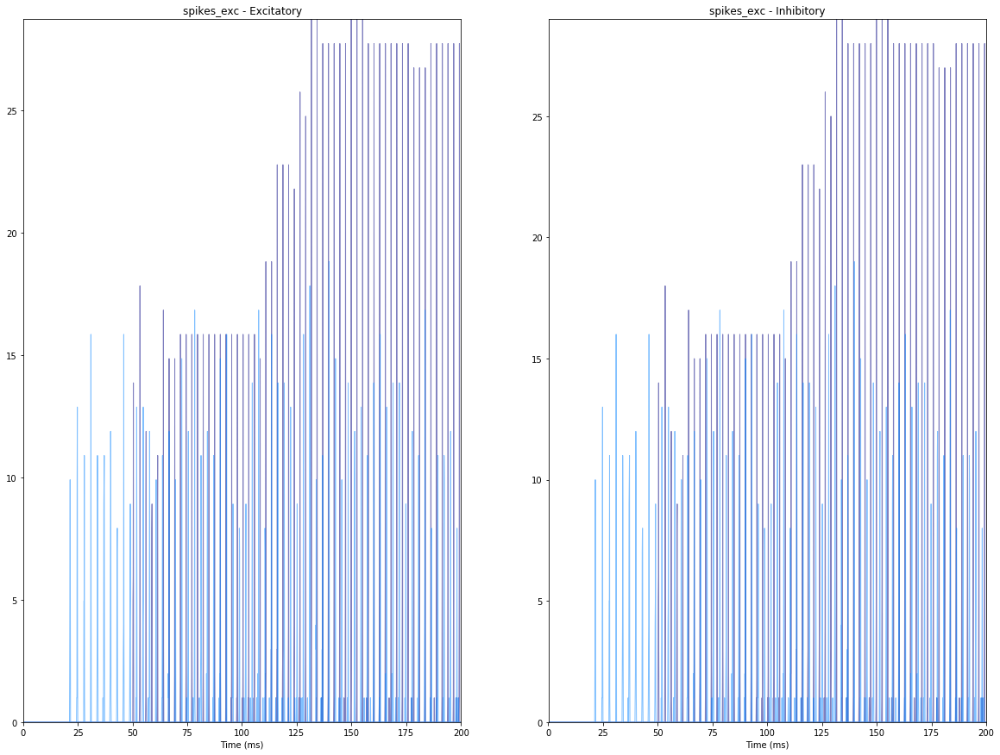

2020-01-31 16:29:53,229 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:53,269 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:53,459 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:53,490 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:29:53,486 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:53,510 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:53,667 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:53,686 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:53,716 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:53,732 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:53,746 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:53,779 - DEBUG - matplotlib.axes._base - update_title_pos


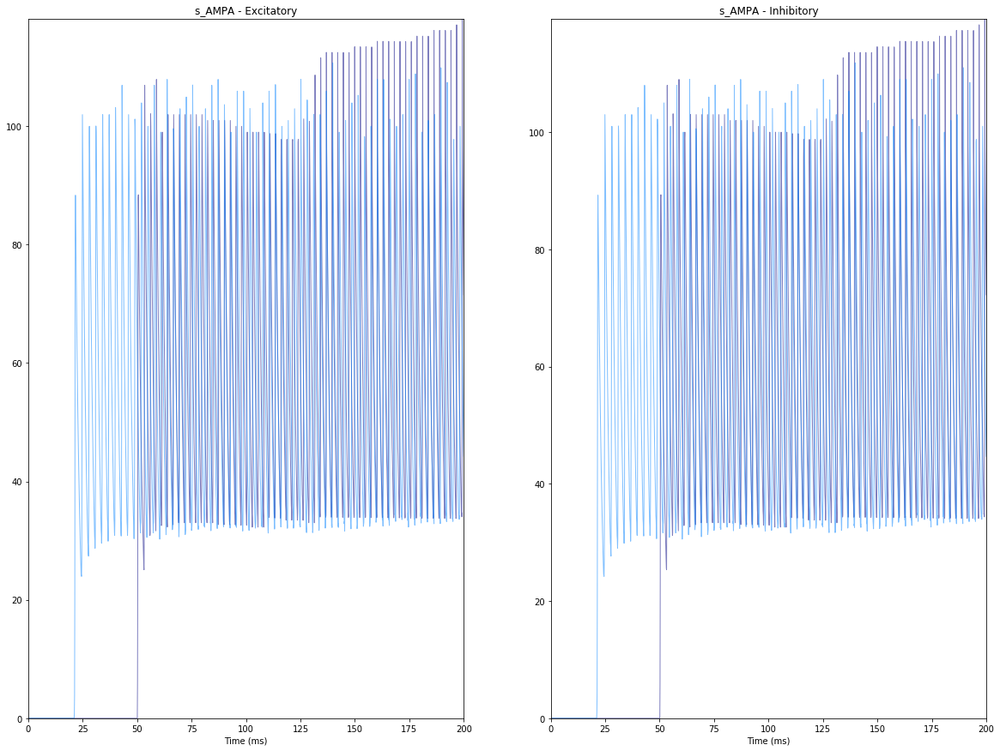

2020-01-31 16:29:53,954 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:53,989 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:54,179 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:54,205 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:29:54,242 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:54,270 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:54,423 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:54,440 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:54,477 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:54,492 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:54,510 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:54,540 - DEBUG - matplotlib.axes._base - update_title_pos


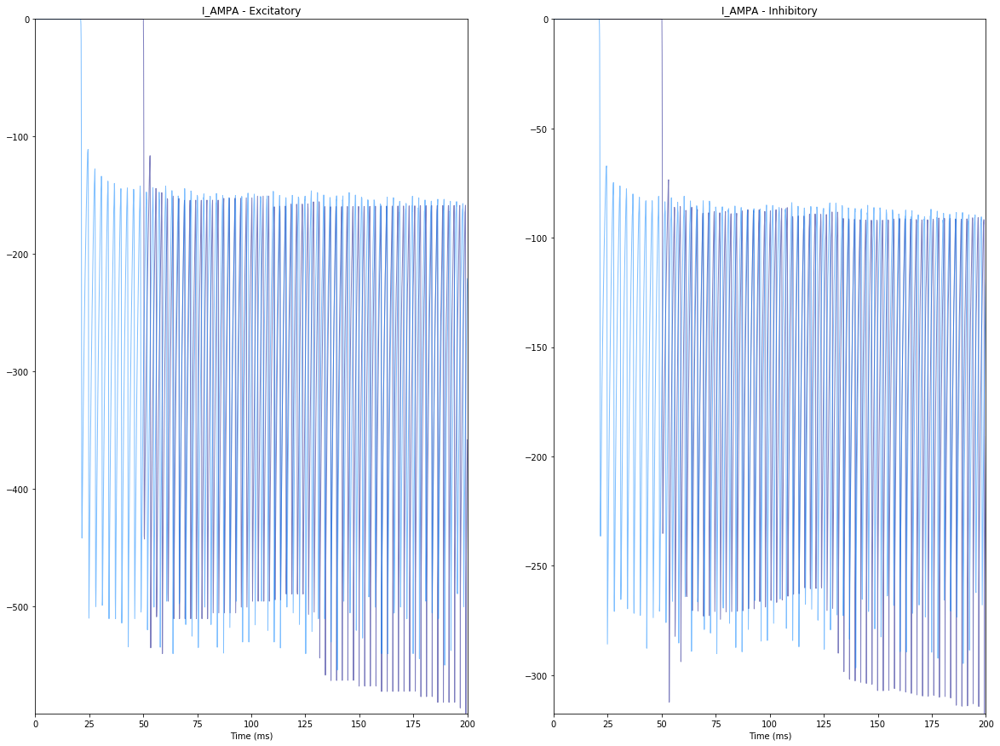

2020-01-31 16:29:54,717 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:54,752 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:54,953 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:54,985 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:29:55,021 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:55,049 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:55,210 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:55,227 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:55,257 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:55,273 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:55,298 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:55,330 - DEBUG - matplotlib.axes._base - update_title_pos


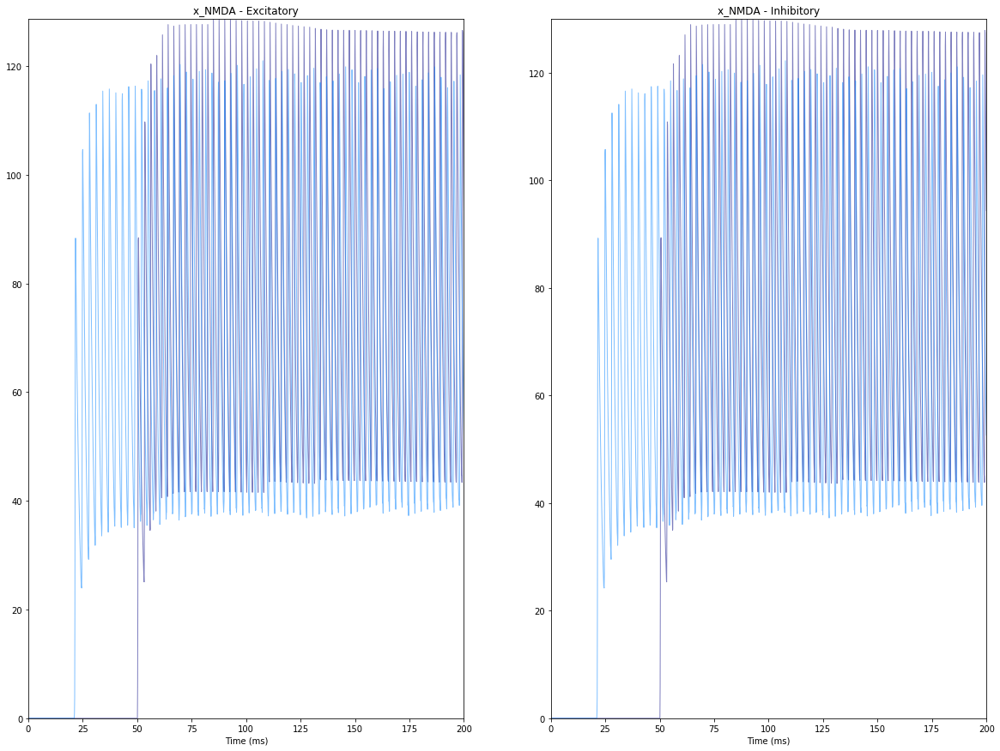

2020-01-31 16:29:55,515 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:55,542 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:55,643 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:55,661 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:29:55,685 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:55,701 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:55,788 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:55,805 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:55,839 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:55,857 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:55,875 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:55,897 - DEBUG - matplotlib.axes._base - update_title_pos


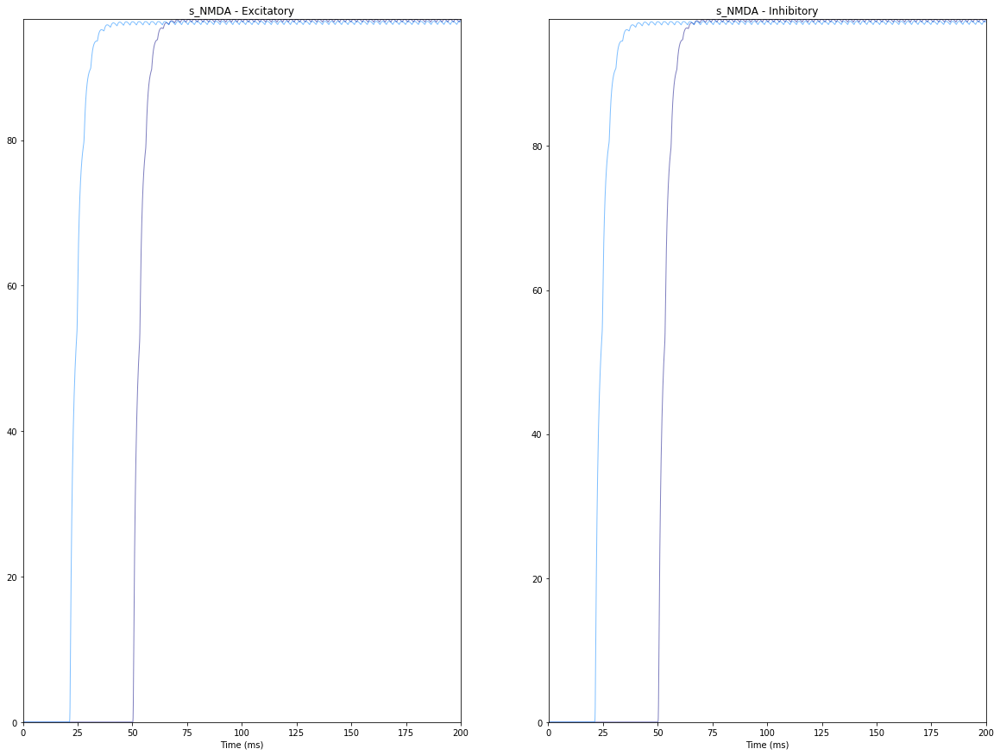

2020-01-31 16:29:56,066 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:56,106 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:56,225 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:56,245 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:29:56,268 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:56,292 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:56,382 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:56,402 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:56,434 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:56,454 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:56,470 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:56,497 - DEBUG - matplotlib.axes._base - update_title_pos


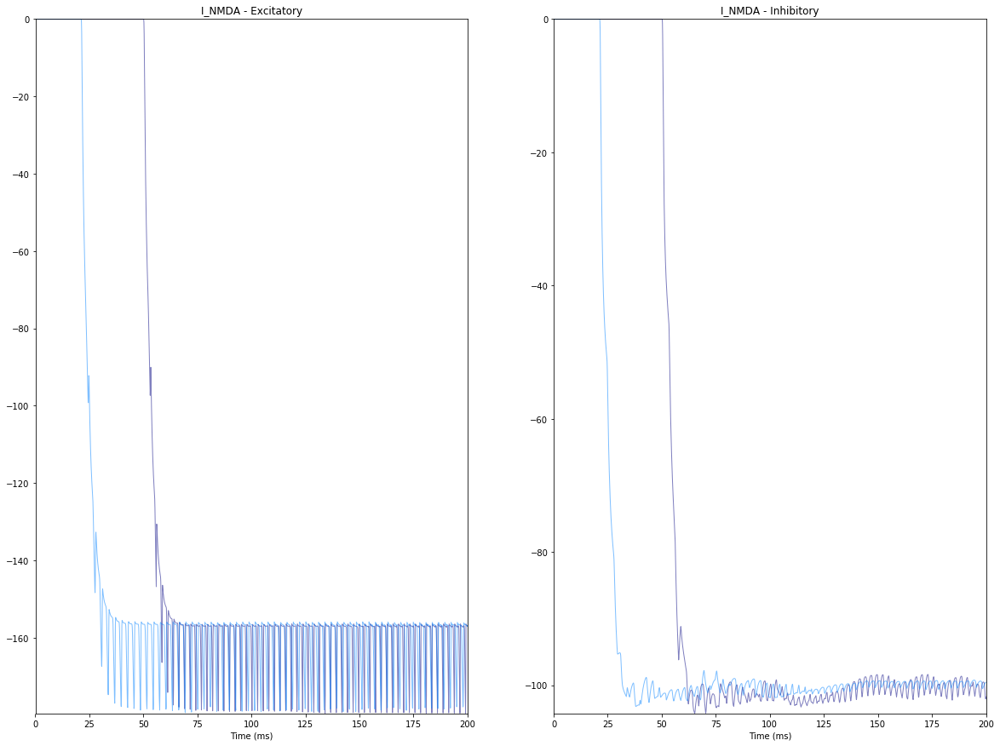

2020-01-31 16:29:56,605 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:56,642 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:56,742 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:56,761 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:29:56,787 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:56,814 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:56,903 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:56,922 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:56,953 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:56,972 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:56,989 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:57,012 - DEBUG - matplotlib.axes._base - update_title_pos


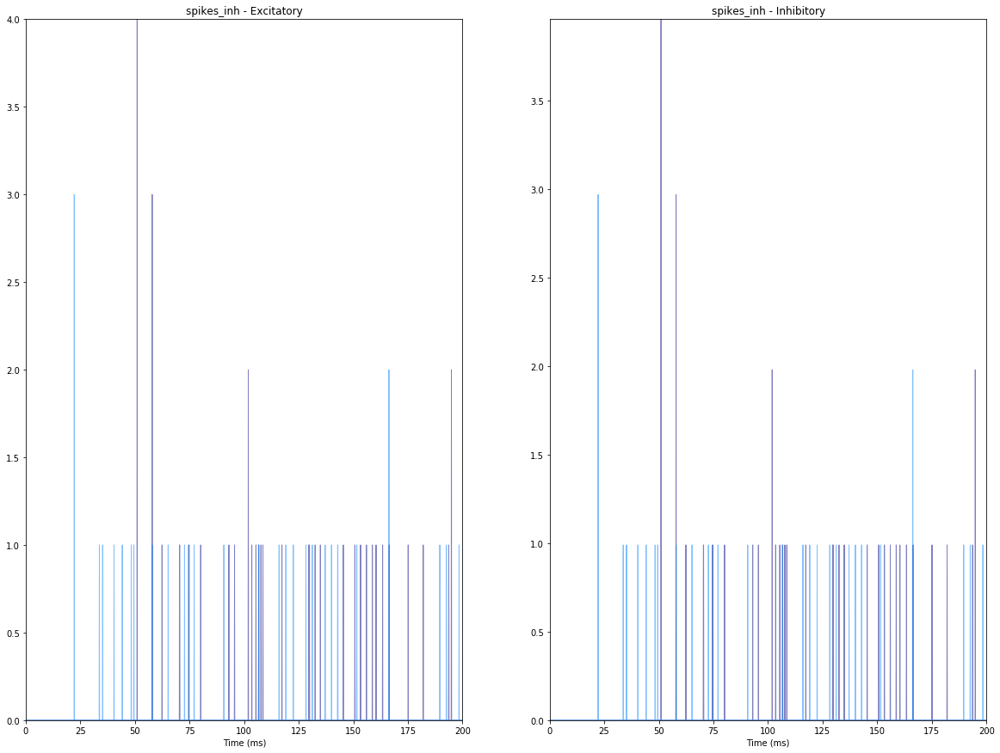

2020-01-31 16:29:57,110 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:57,142 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:57,272 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:57,292 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:29:57,323 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:57,346 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:57,447 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:57,468 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:57,499 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:57,516 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:57,535 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:57,558 - DEBUG - matplotlib.axes._base - update_title_pos


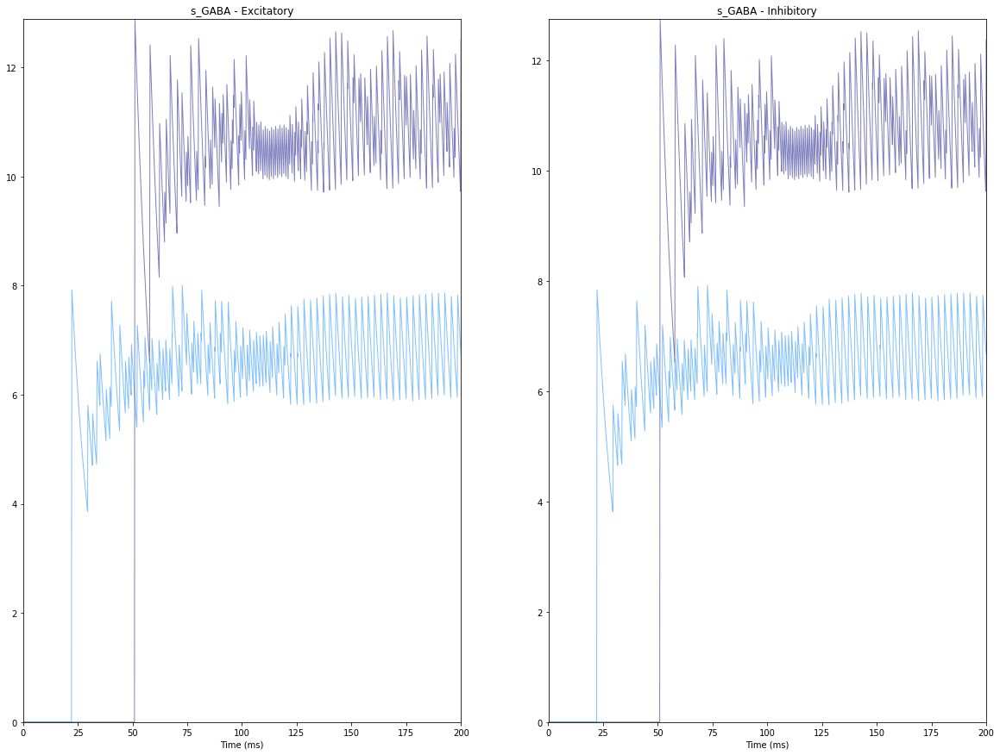

2020-01-31 16:29:57,683 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:57,716 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:57,856 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:57,878 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:29:57,911 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:57,935 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:58,041 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:58,062 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:58,097 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:58,112 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:58,133 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:58,160 - DEBUG - matplotlib.axes._base - update_title_pos


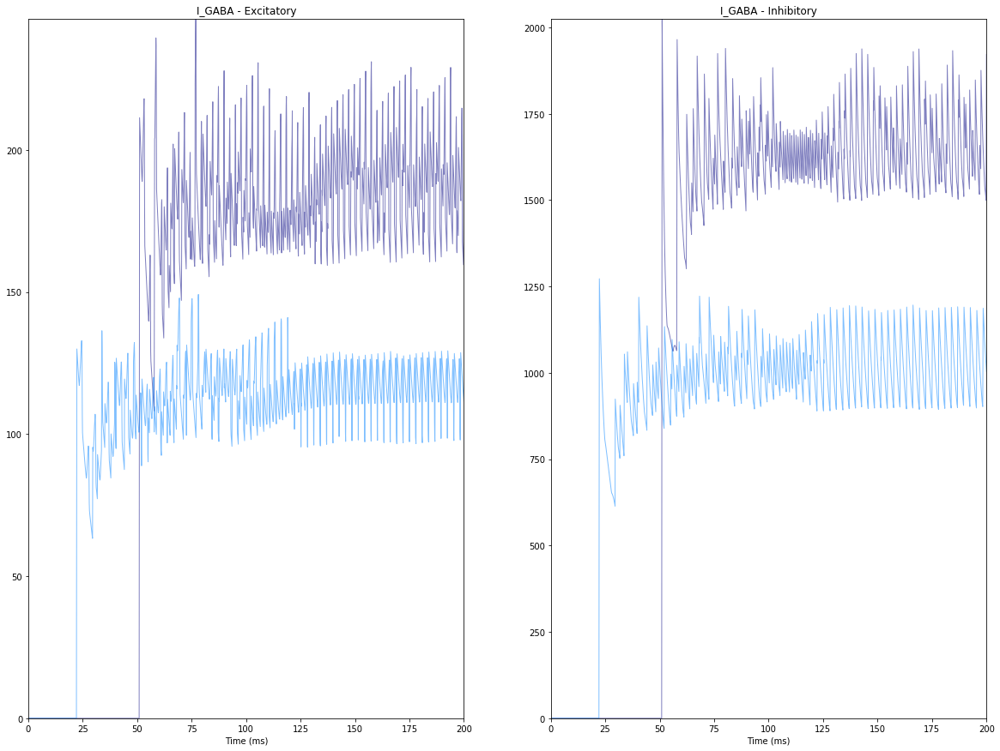

2020-01-31 16:29:58,286 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:58,330 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:58,442 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:58,463 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:29:58,491 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:58,513 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:58,613 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:58,630 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:58,661 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:58,677 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:58,692 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:58,717 - DEBUG - matplotlib.axes._base - update_title_pos


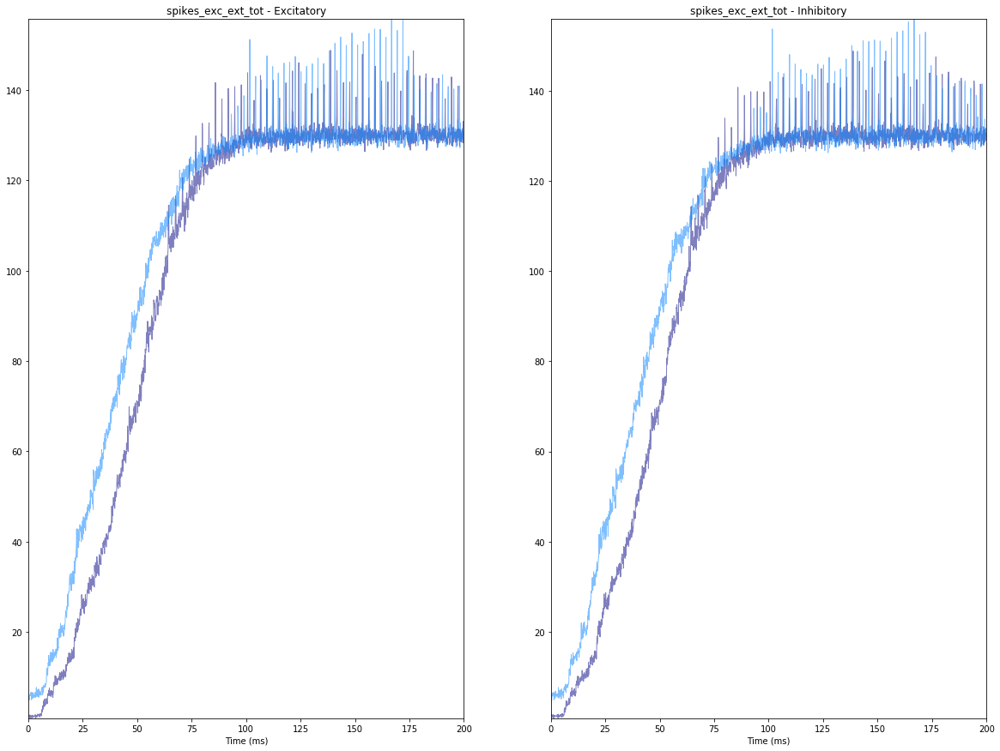

2020-01-31 16:29:58,828 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:58,859 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:58,963 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:58,986 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:29:59,020 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:59,039 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:59,127 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:59,144 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:59,180 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:59,197 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:59,214 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:59,240 - DEBUG - matplotlib.axes._base - update_title_pos


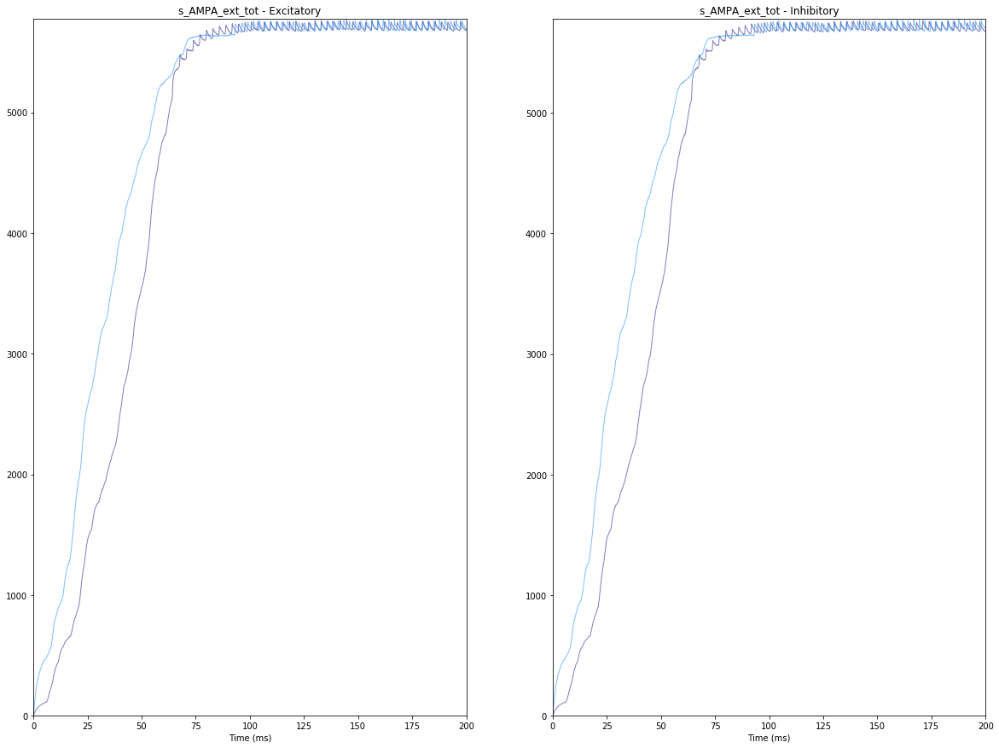

2020-01-31 16:29:59,331 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:59,363 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:59,471 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:59,490 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:29:59,518 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:59,540 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:59,628 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:59,646 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:59,679 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:59,697 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:59,715 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:59,737 - DEBUG - matplotlib.axes._base - update_title_pos


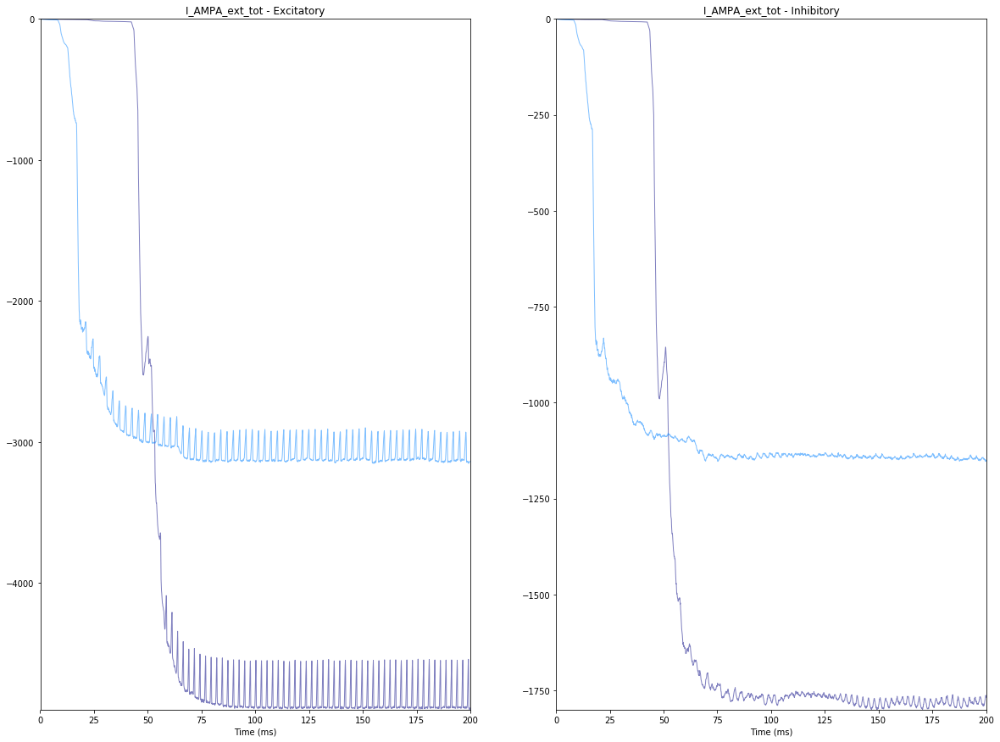

2020-01-31 16:29:59,836 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:59,870 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:29:59,984 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:00,006 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:30:00,041 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:00,065 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:00,156 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:00,174 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:00,206 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:00,224 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:00,242 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:00,265 - DEBUG - matplotlib.axes._base - update_title_pos


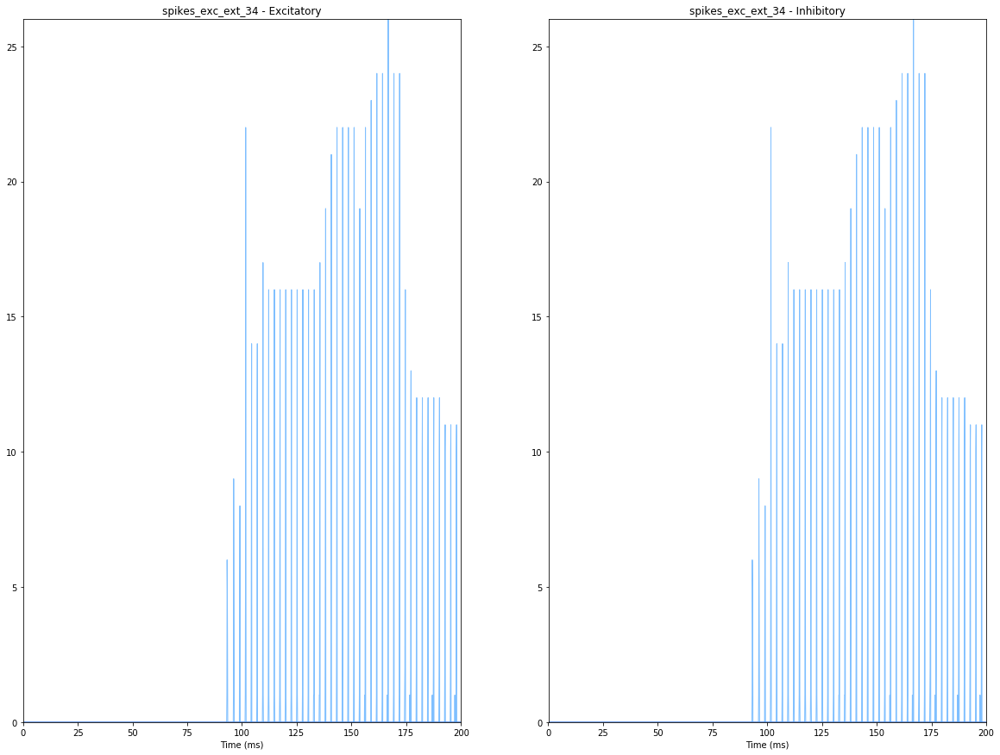

2020-01-31 16:30:00,384 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:00,422 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:00,525 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:00,545 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:30:00,572 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:00,595 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:00,691 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:00,707 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:00,740 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:00,758 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:00,774 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:00,797 - DEBUG - matplotlib.axes._base - update_title_pos


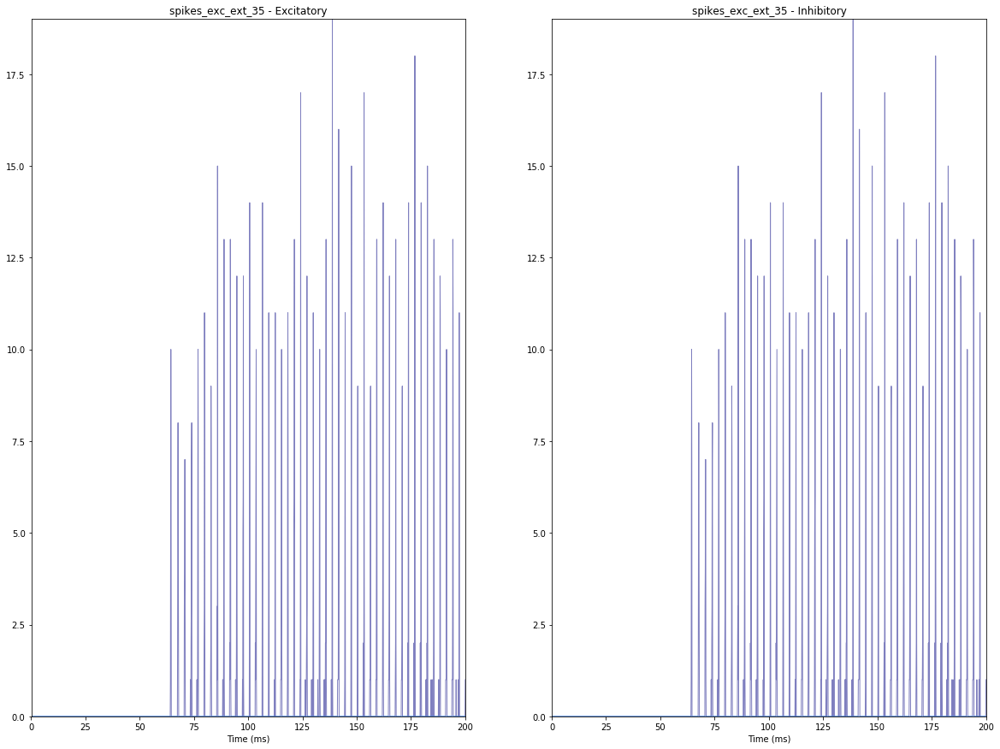

2020-01-31 16:30:00,908 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:00,940 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:01,053 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:01,074 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:30:01,104 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:01,125 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:01,221 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:01,236 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:01,269 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:01,286 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:01,302 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:01,330 - DEBUG - matplotlib.axes._base - update_title_pos


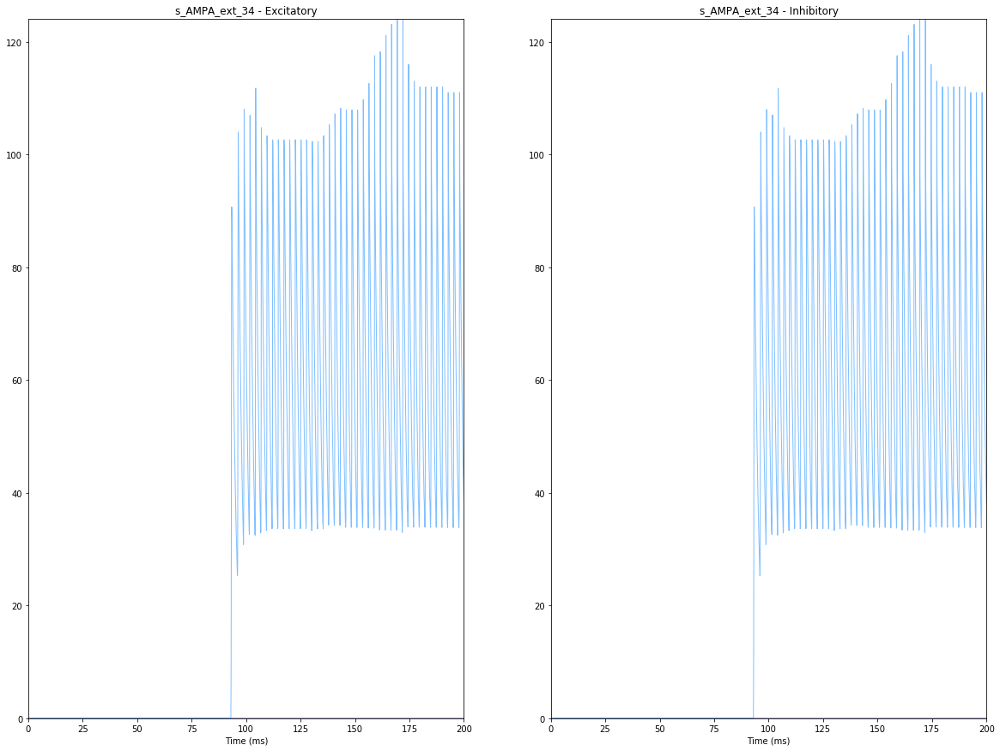

2020-01-31 16:30:01,439 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:01,468 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:01,589 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:01,613 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:30:01,639 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:01,658 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:01,760 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:01,778 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:01,808 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:01,826 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:01,842 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:01,866 - DEBUG - matplotlib.axes._base - update_title_pos


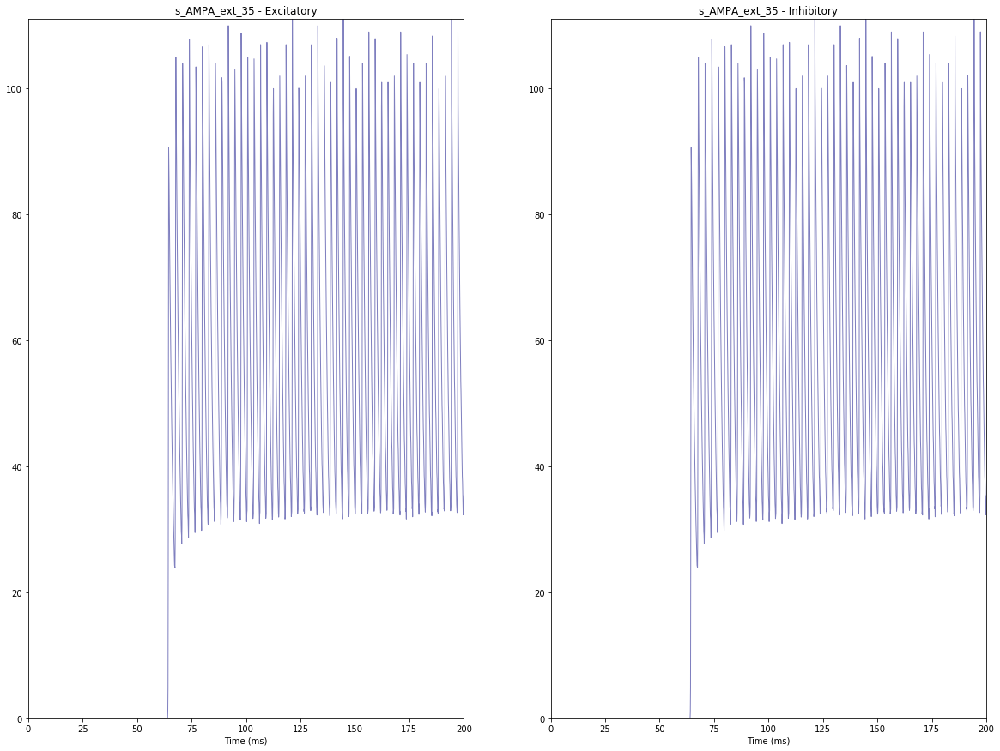

2020-01-31 16:30:01,987 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:02,018 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:02,140 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:02,162 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:30:02,191 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:02,212 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:02,310 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:02,325 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:02,357 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:02,375 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:02,391 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:02,415 - DEBUG - matplotlib.axes._base - update_title_pos


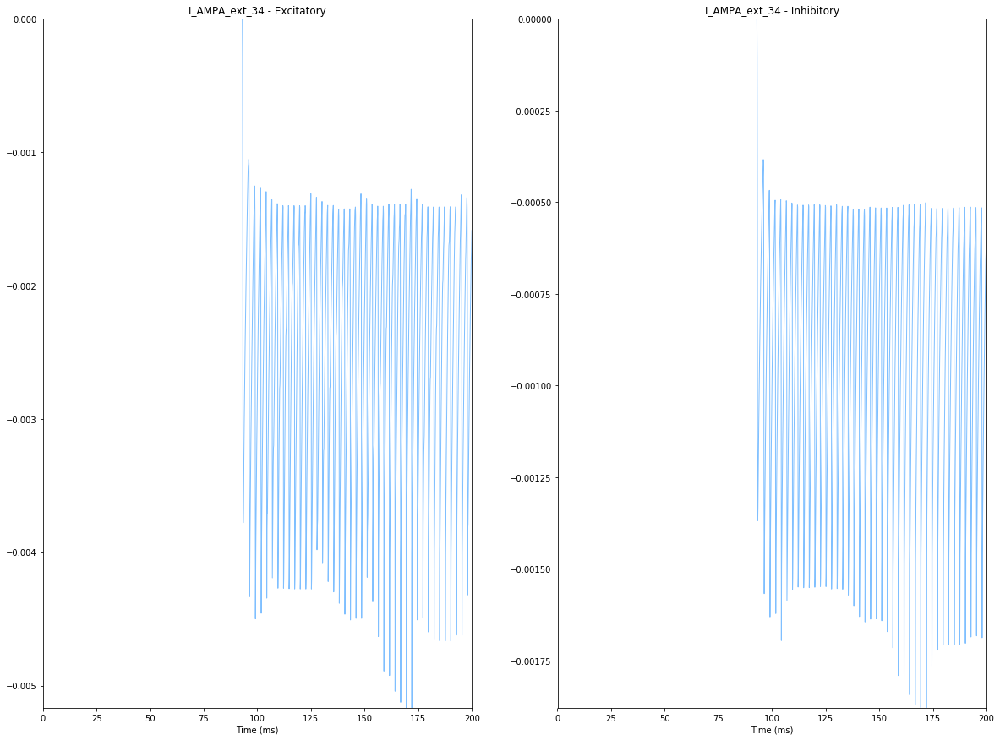

2020-01-31 16:30:02,536 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:02,569 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:02,699 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:02,720 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-01-31 16:30:02,748 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:02,769 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:02,886 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:02,903 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:02,939 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:02,955 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:02,973 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:02,997 - DEBUG - matplotlib.axes._base - update_title_pos


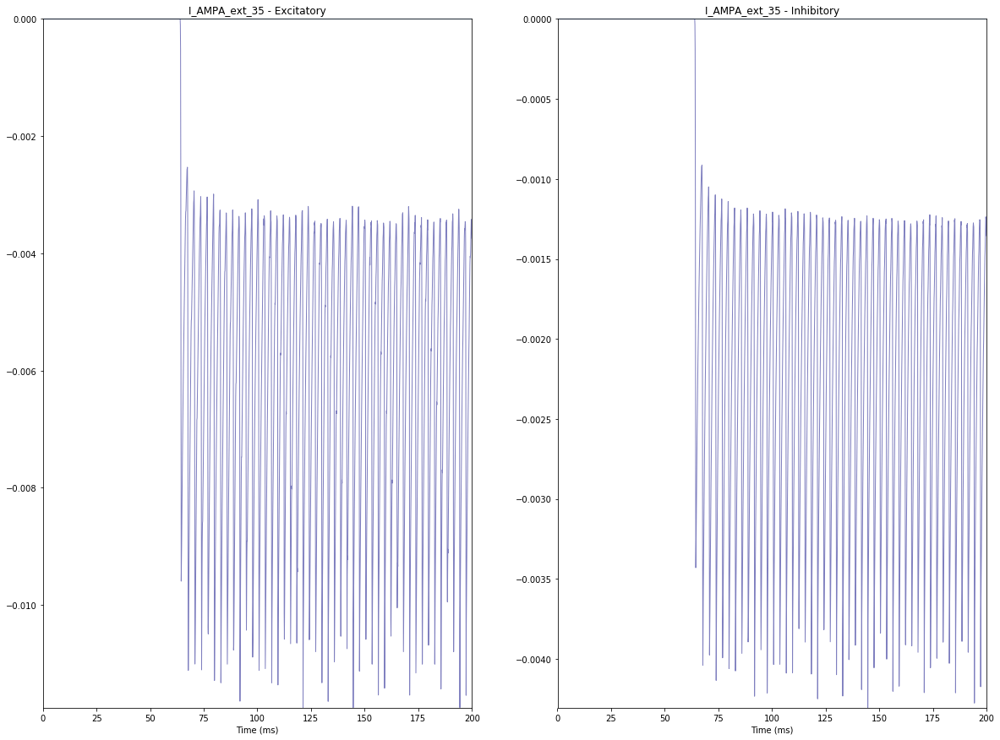

<Figure size 432x288 with 0 Axes>

In [25]:
for data, label in zip([multimeter_mean_data_neuron, multimeter_mean_data_exc,
                        multimeter_mean_data_inh, multimeter_mean_data_ext], 
                       ["", " Excitatory synapses ", " Inhibitory synapses ", " External synapses "]):    
    plotter.plot_multimeter_timeseries(data, plot_per_variable=True,
                                       time_series_class=TimeSeriesRegion, 
                                       time_series_args={}, var_pop_join_str=" - ", 
                                       default_population_label="population",
                                       title="NEST region %stime series" % label)

### Plot spikes' raster and mean spike rate for NEST regions

2020-01-31 16:30:03,650 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:03,673 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:03,699 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:03,713 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:03,805 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:03,824 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:03,845 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:03,856 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:03,872 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:03,892 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:03,912 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:03,923 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:04,003 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:30:04,016 -

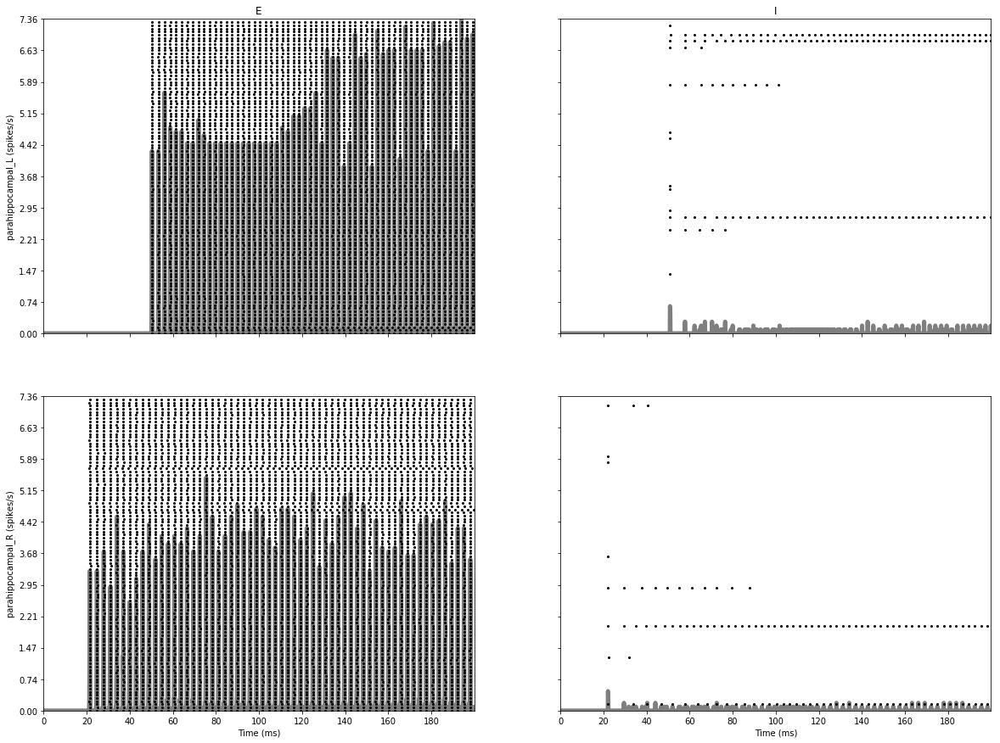

<Figure size 432x288 with 0 Axes>

In [26]:
# Plot spikes and mean field spike rates
rates, spike_detectors = \
    tvb_nest_model.get_mean_spikes_rates_to_TVBTimeSeries(
        spikes_kernel_width= simulator.integrator.dt,  # ms
        spikes_kernel_overlap=0.0, time=t)
if spike_detectors is not None:
    plotter.plot_spikes(spike_detectors, rates=rates, title='Population spikes and mean spike rate')

### Plotting NEST network activity using xarray

In [27]:
from tvb_scripts.time_series.time_series_xarray import TimeSeries as TimeSeriesXarray
import xarray as xr

multimeter_mean_data = nest_network.get_mean_data_from_multimeter()
ts = TimeSeriesXarray(multimeter_mean_data)
print(ts)

ts_exc = ts[:, ["spikes_exc", "s_AMPA", "I_AMPA", "x_NMDA", "s_NMDA", "I_NMDA"]]
ts_exc._data.name = "Mean excitatory synapse data from NEST multimeter"
print(ts_exc)
ts_inh = ts[:, ["spikes_inh", "s_GABA", "I_GABA"]]
ts_inh._data.name = "Mean inhibitory synapse data from NEST multimeter"

# Substitute the per-region synaptic variables with their sums to reduce outputs:
s_AMPA_ext_nest_nodes = ts[:, ['s_AMPA_ext_%d' % node_id for node_id in nest_nodes_ids] ]._data
I_AMPA_ext_nest_nodes = ts[:, ['I_AMPA_ext_%d' % node_id for node_id in nest_nodes_ids] ]._data
spikes_exc_ext_nest_nodes = ts[:, ['spikes_exc_ext_%d' % node_id for node_id in nest_nodes_ids] ]._data

s_AMPA_ext_tot = \
    ts[:, ['s_AMPA_ext_%d' % node_id for node_id in range(nest_network.number_of_nodes)] ].\
    _data.sum(axis=1).expand_dims(axis=1, dim={"Variable": ["s_AMPA_ext_tot"]})
I_AMPA_ext_tot = \
    ts[:, ['I_AMPA_ext_%d' % node_id for node_id in range(nest_network.number_of_nodes)] ].\
    _data.sum(axis=1).expand_dims(axis=1, dim={"Variable": ["I_AMPA_ext_tot"]})
spikes_exc_ext_tot = \
    ts[:, ['spikes_exc_ext_%d' % node_id for node_id in range(nest_network.number_of_nodes)] ].\
    _data.sum(axis=1).expand_dims(axis=1, dim={"Variable": ["spikes_exc_ext_tot"]})

print(ts_inh)
ts_ext = TimeSeriesXarray( 
            xr.concat([spikes_exc_ext_tot, s_AMPA_ext_tot, I_AMPA_ext_tot, 
                       spikes_exc_ext_nest_nodes, s_AMPA_ext_nest_nodes, I_AMPA_ext_nest_nodes], "Variable"))
ts_ext._data.name = "Mean external synapse data from NEST multimeter"
print(ts_ext)

ts_neuron = ts[:, ["V_m", "I_L", "I_e"]]

TimeSeries (
  Dimensions ....... ['Time', 'Variable', 'Region', 'Population']
  Length ........... 2000
  Sample period .... 0.1
  Time units ....... 
  Time-series name . Mean data from Spiking Network multimeter
  Time-series type . TimeSeries
  [min, median, max]  [-1533.54, 0.64, 2023.85]
  dtype ............ float64
  shape ............ (2000, 216, 2, 2)
)
TimeSeries (
  Dimensions ....... ['Time', 'Variable', 'Region', 'Population']
  Length ........... 2000
  Sample period .... 0.1
  Time units ....... 
  Time-series name . Mean data from Spiking Network multimeter
  Time-series type . TimeSeries
  [min, median, max]  [-591.004, 0, 129.944]
  dtype ............ float64
  shape ............ (2000, 6, 2, 2)
)
TimeSeries (
  Dimensions ....... ['Time', 'Variable', 'Region', 'Population']
  Length ........... 2000
  Sample period .... 0.1
  Time units ....... 
  Time-series name . Mean data from Spiking Network multimeter
  Time-series type . TimeSeries
  [min, median, max]  [0, 6.

2020-01-31 16:31:29,209 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:29,237 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:29,257 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:29,284 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:29,317 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:29,346 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:29,385 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:29,409 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:29,463 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:29,489 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:29,530 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:29,558 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:29,601 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:29,619 -

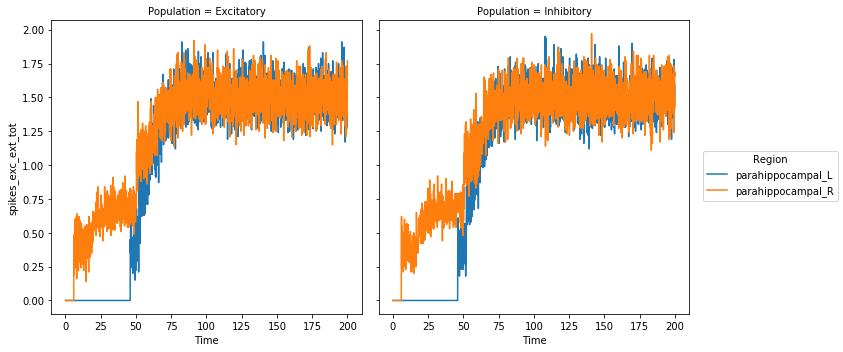

2020-01-31 16:31:29,826 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:29,859 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:29,881 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:29,909 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:29,942 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:29,971 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:30,000 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:30,019 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:30,062 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:30,081 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:30,114 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:30,131 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:30,171 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:30,190 -

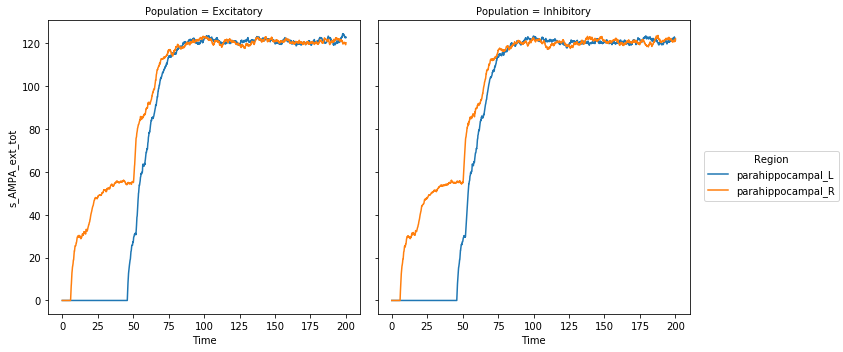

2020-01-31 16:31:30,378 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:30,407 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:30,430 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:30,453 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:30,478 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:30,505 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:30,533 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:30,551 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:30,595 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:30,616 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:30,647 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:30,670 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:30,706 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:30,725 -

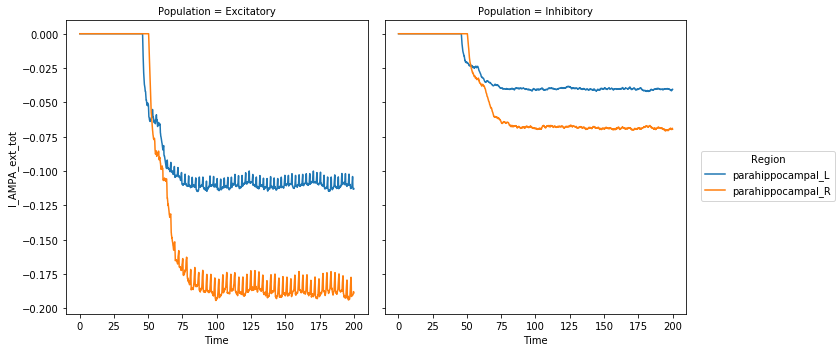

2020-01-31 16:31:30,920 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:30,945 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:30,968 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:30,992 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:31,019 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:31,044 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:31,075 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:31,093 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:31,136 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:31,155 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:31,186 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:31,206 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:31,250 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:31,266 -

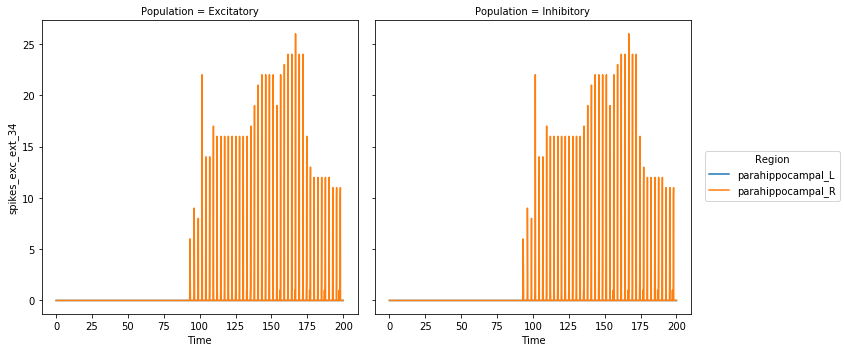

2020-01-31 16:31:31,447 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:31,483 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:31,509 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:31,536 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:31,562 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:31,586 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:31,621 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:31,639 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:31,683 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:31,703 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:31,747 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:31,772 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:31,814 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:31,834 -

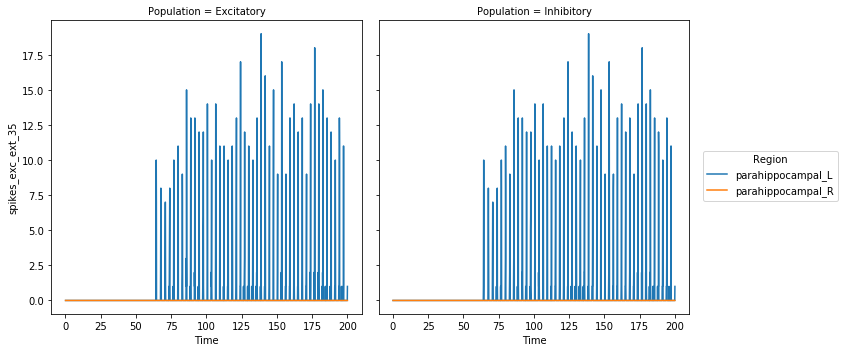

2020-01-31 16:31:32,022 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:32,048 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:32,066 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:32,088 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:32,112 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:32,138 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:32,168 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:32,189 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:32,238 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:32,258 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:32,293 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:32,315 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:32,358 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:32,379 -

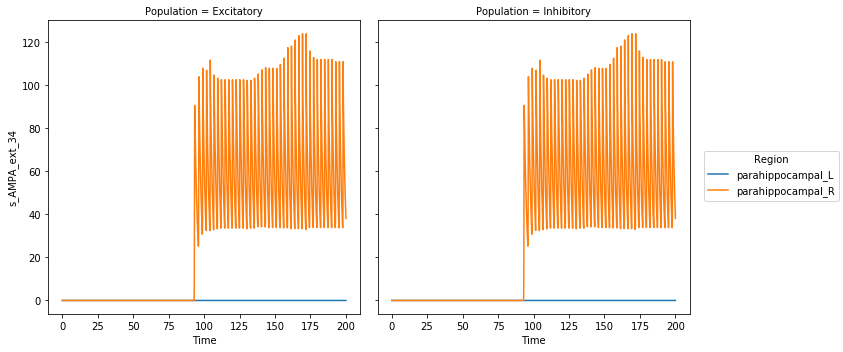

2020-01-31 16:31:32,573 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:32,597 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:32,618 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:32,643 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:32,668 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:32,692 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:32,728 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:32,747 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:32,800 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:32,817 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:32,847 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:32,871 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:32,914 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:32,935 -

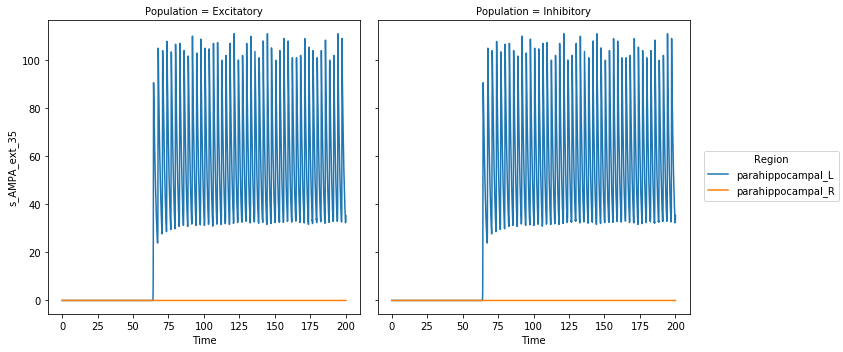

2020-01-31 16:31:33,220 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:33,247 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:33,264 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:33,288 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:33,311 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:33,337 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:33,365 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:33,388 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:33,432 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:33,449 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:33,480 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:33,498 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:33,536 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:33,557 -

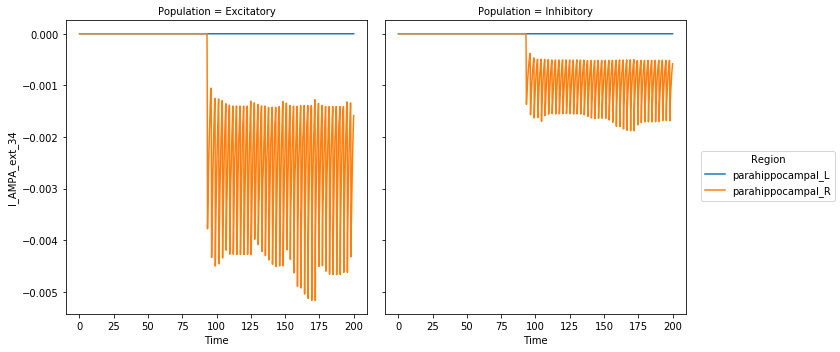

2020-01-31 16:31:33,747 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:33,776 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:33,795 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:33,818 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:33,843 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:33,866 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:33,894 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:33,912 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:33,964 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:33,988 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:34,023 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:34,041 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:34,082 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:34,101 -

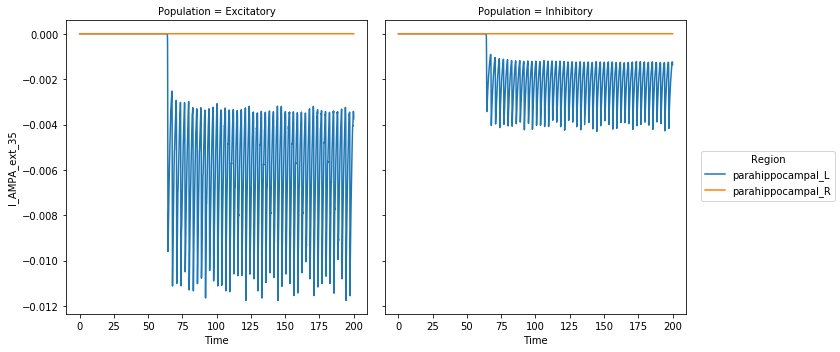

2020-01-31 16:31:34,299 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:34,325 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:34,343 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:34,369 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:34,399 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:34,426 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:34,463 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:34,482 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:34,535 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:34,558 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:34,591 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:34,613 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:34,657 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:34,676 -

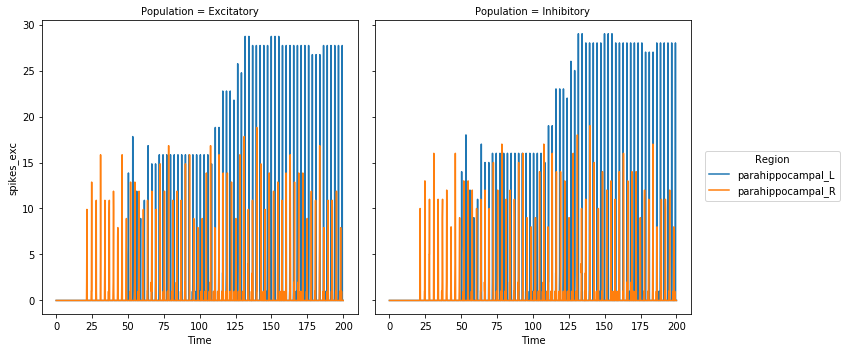

2020-01-31 16:31:34,877 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:34,905 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:34,929 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:34,954 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:34,984 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:35,013 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:35,048 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:35,068 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:35,137 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:35,164 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:35,201 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:35,224 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:35,280 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:35,296 -

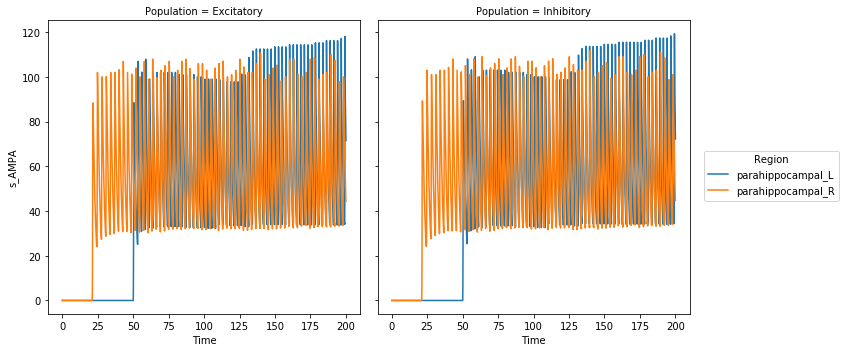

2020-01-31 16:31:35,509 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:35,540 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:35,558 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:35,586 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:35,615 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:35,642 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:35,679 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:35,699 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:35,760 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:35,786 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:35,818 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:35,839 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:35,889 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:35,906 -

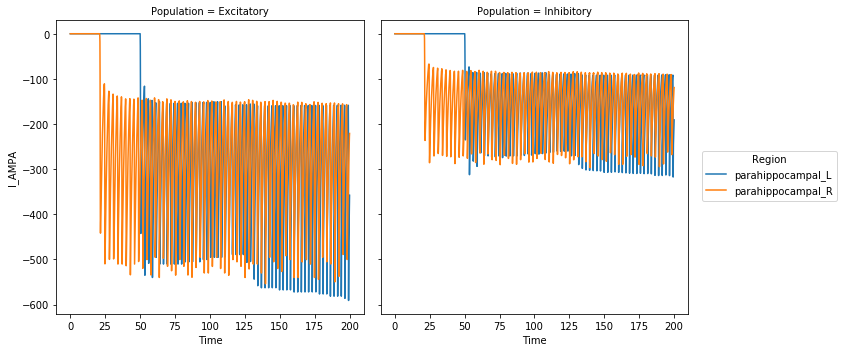

2020-01-31 16:31:36,112 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:36,139 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:36,161 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:36,186 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:36,212 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:36,241 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:36,282 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:36,302 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:36,373 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:36,394 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:36,433 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:36,456 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:36,515 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:36,534 -

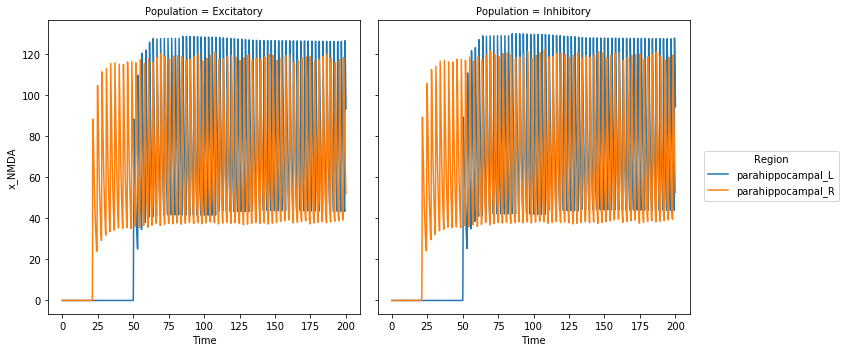

2020-01-31 16:31:36,756 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:36,786 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:36,806 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:36,831 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:36,857 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:36,882 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:36,913 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:36,931 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:36,971 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:36,988 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:37,020 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:37,036 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:37,071 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:37,088 -

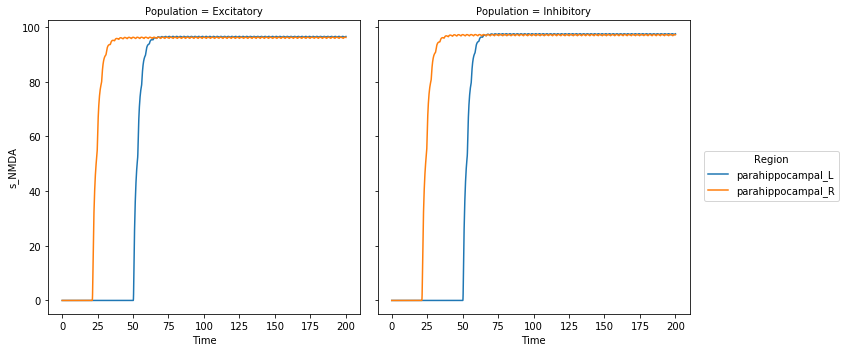

2020-01-31 16:31:37,272 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:37,297 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:37,319 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:37,342 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:37,366 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:37,389 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:37,427 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:37,444 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:37,490 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:37,510 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:37,537 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:37,553 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:37,590 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:37,607 -

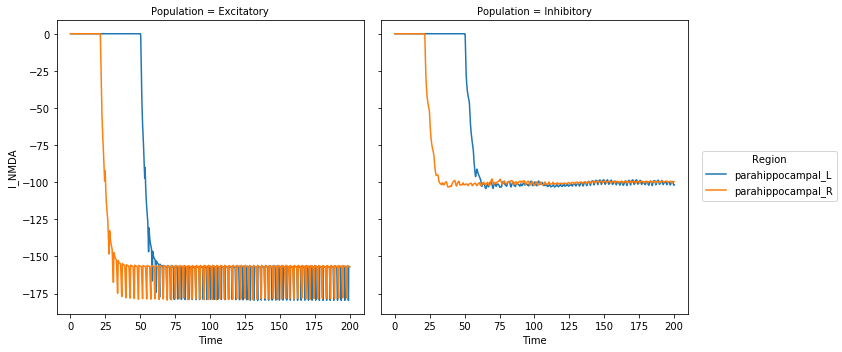

2020-01-31 16:31:37,801 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:37,834 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:37,864 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:37,887 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:37,908 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:37,930 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:37,962 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:37,981 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:38,029 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:38,048 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:38,082 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:38,099 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:38,134 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:38,150 -

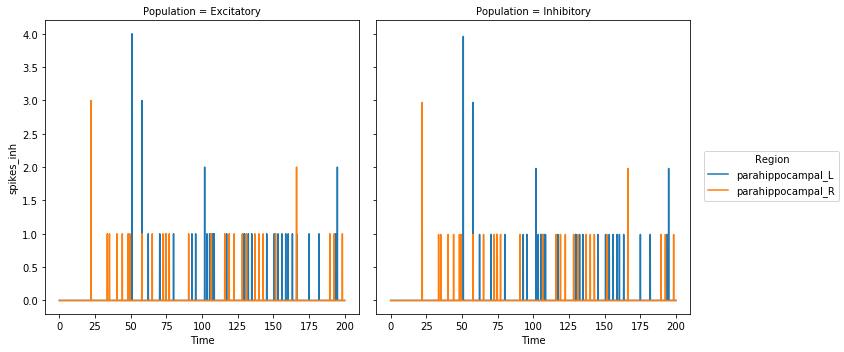

2020-01-31 16:31:38,417 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:38,442 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:38,462 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:38,487 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:38,509 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:38,531 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:38,562 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:38,582 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:38,634 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:38,652 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:38,686 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:38,706 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:38,747 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:38,765 -

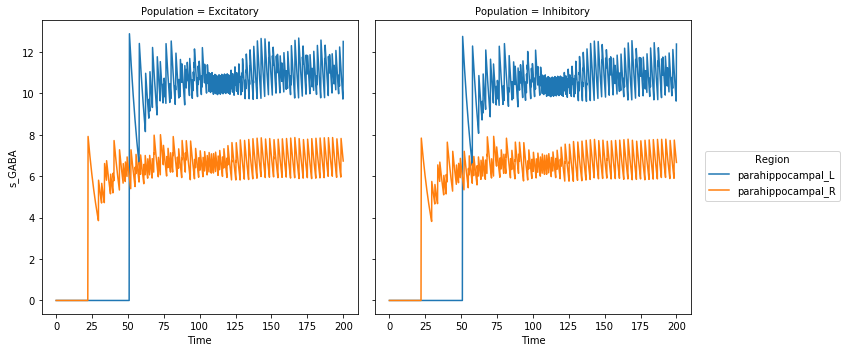

2020-01-31 16:31:38,966 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:38,999 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:39,017 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:39,042 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:39,071 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:39,098 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:39,134 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:39,150 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:39,193 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:39,209 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:39,240 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:39,257 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:39,303 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:39,326 -

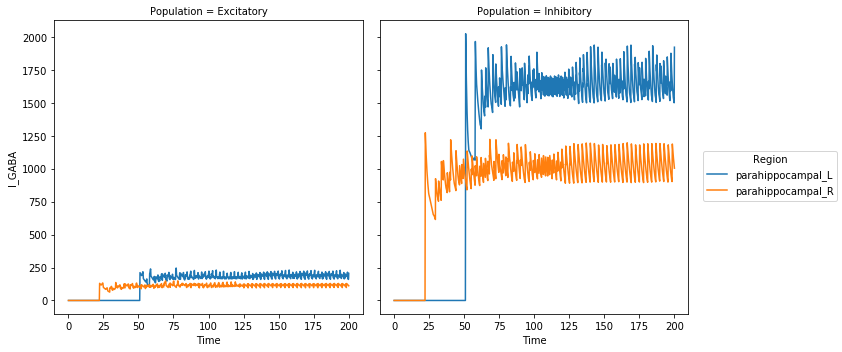

2020-01-31 16:31:39,521 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:39,550 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:39,569 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:39,598 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:39,625 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:39,649 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:39,685 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:39,703 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:39,746 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:39,763 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:39,799 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:39,817 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:39,854 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:39,875 -

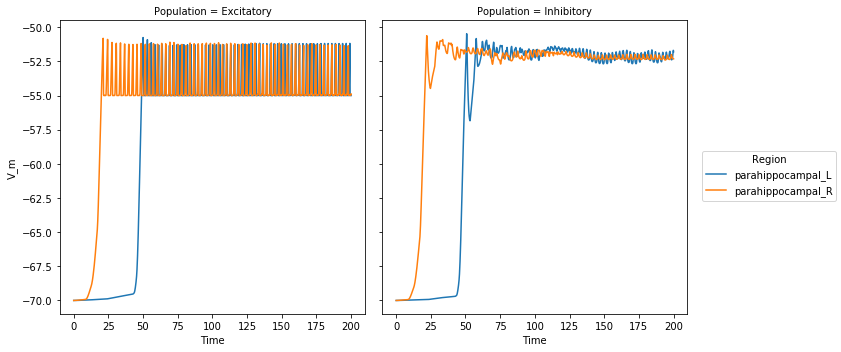

2020-01-31 16:31:40,068 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:40,095 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:40,116 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:40,143 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:40,168 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:40,192 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:40,236 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:40,259 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:40,309 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:40,328 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:40,363 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:40,384 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:40,424 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:40,442 -

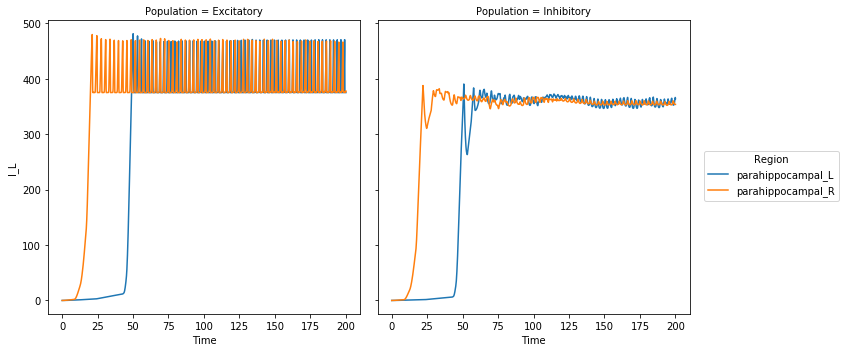

2020-01-31 16:31:40,652 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:40,680 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:40,701 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:40,723 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:40,751 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:40,769 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:40,805 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:40,823 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:40,864 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:40,886 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:40,919 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:40,937 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:40,968 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:40,985 -

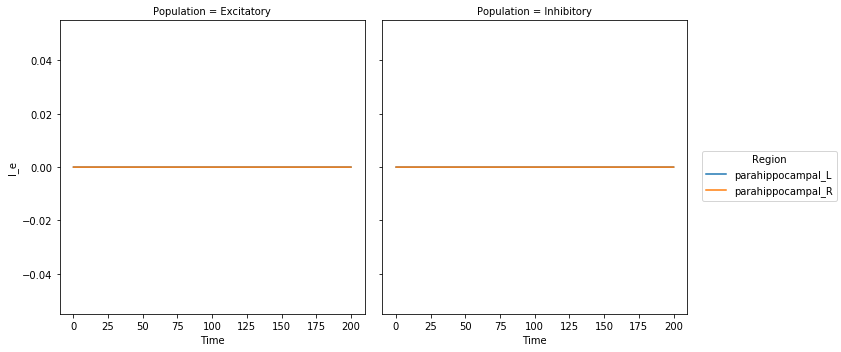

In [28]:
# ts.plot(plotter=plotter, )
for this_ts in [ts_ext, ts_exc, ts_inh, ts_neuron]:
    for var in this_ts.labels_dimensions[this_ts.labels_ordering[1]]:
        temp = this_ts[:, var]
        temp._data.name = "Mean %s data from NEST multimeter" % var
        temp.title = temp._data.name
        temp.plot_timeseries(plotter=plotter, figsize=(10, 5))
# ts_ext.plot_timeseries(plotter=plotter, per_variable=True, figsize=(10, 5))
# ts_exc.plot_timeseries(plotter=plotter, per_variable=True, figsize=(10, 5))
# ts_inh.plot_timeseries(plotter=plotter, per_variable=True, figsize=(10, 5))
# ts_neuron.plot_timeseries(plotter=plotter, per_variable=True, figsize=(10, 5))

In [29]:
# ts_ext.plot_raster(plotter=plotter, per_variable=True, linestyle="--", alpha=1.0, linewidth=0.5, figsize=(10, 5))
# ts_exc.plot_raster(plotter=plotter, per_variable=True, linestyle="--", alpha=1.0, linewidth=0.5, figsize=(10, 5))
# ts_inh.plot_raster(plotter=plotter, per_variable=True, linestyle="--", alpha=1.0, linewidth=0.5, figsize=(10, 5))
# ts_neuron.plot_raster(plotter=plotter, per_variable=True, linestyle="--", alpha=1.0, linewidth=0.5, figsize=(10, 5))

### Plotting NEST network spiking activity using xarray

2020-01-31 16:31:42,796 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:42,821 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:42,848 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:42,880 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:42,910 - DEBUG - matplotlib.colorbar - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7ff50c9bab70>
2020-01-31 16:31:42,912 - DEBUG - matplotlib.colorbar - Using auto colorbar locator on colorbar
2020-01-31 16:31:42,913 - DEBUG - matplotlib.colorbar - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7ff50c9bab70>
2020-01-31 16:31:42,914 - DEBUG - matplotlib.colorbar - Setting pcolormesh
2020-01-31 16:31:42,937 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:44,013 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:45,147 - DEBUG - matplotlib.axes._base - update_title_pos
2020-01-31 16:31:46,279 - DEBUG - matp

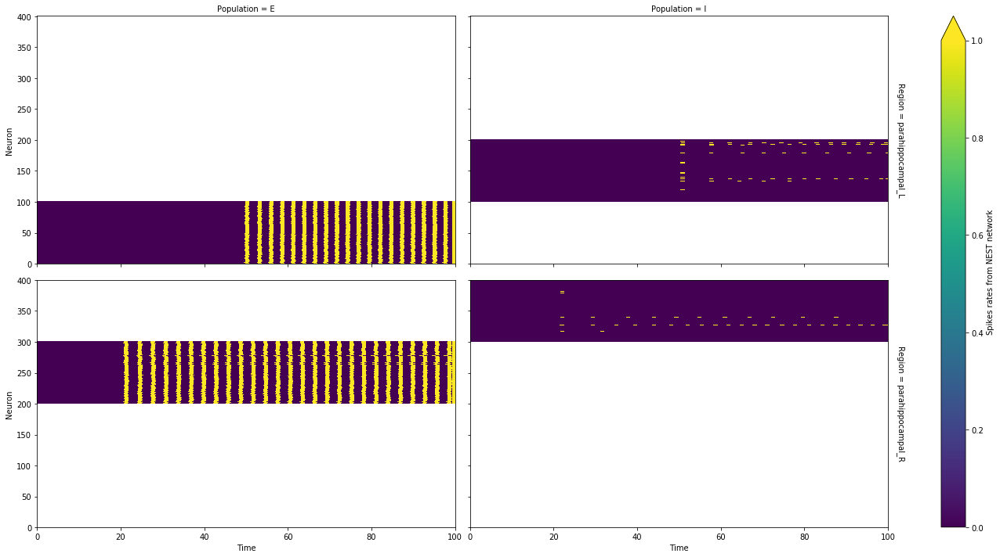

In [30]:
rates = nest_network.compute_spikes_rates(
            mode="per_neuron", population_devices=None, regions=None,
            devices_dim_name="Population", name="Spikes rates from NEST network",
            spikes_kernel_width=1.0, # spikes_kernel_n_intervals=10,
            spikes_kernel_overlap=0.5, min_spike_interval=None, time=np.arange(0, 100.0, 0.01),
            spikes_kernel=None)[0]

rates.plot(x=rates.dims[0], y=rates.dims[3], row=rates.dims[2], col=rates.dims[1], robust=True, figsize=(20, 10))
plotter.base._save_figure(figure_name="Spike rates per neuron")

# Next steps


### 1. Confirm spiking neuron model by reproducing qualitatively the mean field dynamics (e.g., bifurcations) the theory predicts

???Which interfaces should I test???


### 2. Fine tune the TVB -> NEST coupling by reproducing qualitatively the mean field dynamics under TVB input first for one-region NEST spiking network, and then for 2-region or 3-region interacting ones



### 3. Parameter investigation of TVB -> NEST coupling for robustness around the point of fine tuning

Possible parameters to vary:

1. Order (i.e., number) of spiking neurons per population (to also investigate computational efficiency...)

2. Total strength/scaling of TVB large scale coupling, G

3. Feedback inhibition parameter J_i


??? How to scale parameters with the order of spiking neurons per population, so that the input a single neuron receives remains the same ???

For instance...

I could keep the total number of connections per neuron the same by applying a sparse neuronal connectivity...

or...

I could downscale the connections' weights...

# Future work

Use co-simulation in memory consolidation networks

# References

1 Paula Sanz Leon, Stuart A. Knock, M. Marmaduke Woodman, Lia Domide, <br>
  Jochen Mersmann, Anthony R. McIntosh, Viktor Jirsa (2013) <br>
  The Virtual Brain: a simulator of primate brain network dynamics. <br>
  Frontiers in Neuroinformatics (7:10. doi: 10.3389/fninf.2013.00010) <br>
  https://www.thevirtualbrain.org/tvb/zwei <br>
  https://github.com/the-virtual-brain <br>

2 Ritter P, Schirner M, McIntosh AR, Jirsa VK. 2013.  <br>
  The Virtual Brain integrates computational modeling  <br>
  and multimodal neuroimaging. Brain Connectivity 3:121–145. <br>
   
3 Deco Gustavo, Ponce Alvarez Adrian, Dante Mantini, Gian Luca Romani, <br>
  Patric Hagmann and Maurizio Corbetta. <br>
  Resting-State Functional Connectivity Emerges from Structurally and <br>
  Dynamically Shaped Slow Linear Fluctuations. <br>
  The Journal of Neuroscience 32(27), 11239-11252, 2013.<br>

4 Jordan, Jakob; Mørk, Håkon; Vennemo, Stine Brekke;   Terhorst, Dennis; Peyser, <br>
  Alexander; Ippen, Tammo; Deepu, Rajalekshmi;   Eppler, Jochen Martin; <br>
  van Meegen, Alexander;   Kunkel, Susanne; Sinha, Ankur; Fardet, Tanguy; Diaz, <br>
  Sandra; Morrison, Abigail; Schenck, Wolfram; Dahmen, David;   Pronold, Jari; <br>
  Stapmanns, Jonas;   Trensch, Guido; Spreizer, Sebastian;   Mitchell, Jessica; <br>
  Graber, Steffen; Senk, Johanna; Linssen, Charl; Hahne, Jan; Serenko, Alexey; <br>
  Naoumenko, Daniel; Thomson, Eric;   Kitayama, Itaru; Berns, Sebastian;   <br>
  Plesser, Hans Ekkehard <br>
  NEST is a simulator for spiking neural network models that focuses <br>
  on the dynamics, size and structure of neural systems rather than on <br>
  the exact morphology of individual neurons. <br>
  For further information, visit http://www.nest-simulator.org. <br>
  The release notes for this release are available at  <br>
  https://github.com/nest/nest-simulator/releases/tag/v2.18.0 <br>